In [237]:
import pandas as pd
import matplotlib.pyplot as plt
import koreanize_matplotlib
import numpy as np
import os
import operator

In [238]:
# 연산자 함수화
ops = {
    '+': operator.add,
    '-': operator.sub,
    '*': operator.mul,
    '/': operator.truediv
}

In [239]:
infl = pd.read_csv("C:\\Users\\minju\\OneDrive\\바탕 화면\\다트비\\학술제_2025-2\\리츠\\관련 데이터\\기대인플레이션율.csv")
infl = infl.T.iloc[1:]
infl.reset_index(inplace=True)
infl = infl.rename(columns={'index':'기준월', 0: '물가인식', 1: '기대인플레이션', 
                        2: '기대인플레이션_3년', 3: '기대인플레이션_5년'})
infl = infl.iloc[3:]
infl = infl[['기준월','기대인플레이션']]
infl['기준월'] = pd.to_datetime(infl['기준월'])
infl['날짜'] = (
    pd.to_datetime(
        infl['기준월'].dt.year.astype(str) + '-' + infl['기준월'].dt.month.astype(str) + '-01'
    ) + pd.offsets.MonthEnd(0)
)
infl['기준월'] = (
    infl['기준월'].dt.year.astype(str) + '-' + infl['기준월'].dt.month.astype(str)
)
infl['기대인플레이션'] = infl['기대인플레이션'] / 100
infl

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\465053829.py:8: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,기준월,기대인플레이션,날짜
3,2011-1,0.036,2011-01-31
4,2011-2,0.037,2011-02-28
5,2011-3,0.039,2011-03-31
6,2011-4,0.04,2011-04-30
7,2011-5,0.039,2011-05-31
...,...,...,...
176,2025-6,0.024,2025-06-30
177,2025-7,0.025,2025-07-31
178,2025-8,0.026,2025-08-31
179,2025-9,0.025,2025-09-30


In [240]:
e_return= pd.read_csv('리츠 요구수익률_ver2.csv')
e_return = e_return[['기준일자', '리츠명', '요구수익률','rf','TRP','ERP']]
e_return['요구수익률'] = e_return['요구수익률'] / 100
e_return['rf'] = e_return['rf'] / 100
e_return['TRP'] = e_return['TRP'] / 100
e_return['ERP'] = e_return['ERP'] / 100
e_return.rename(columns={'리츠명':'name'}, inplace=True)
e_return['기준일자'] = pd.to_datetime(e_return['기준일자'])

e_return['날짜'] = (
    pd.to_datetime(
        e_return['기준일자'].dt.year.astype(str) + '-' + e_return['기준일자'].dt.month.astype(str) + '-01'
    ) + pd.offsets.MonthEnd(0)
)

e_return

,기준일자,name,요구수익률,rf,TRP,ERP,날짜
0,2018-09-28,신한알파리츠,0.041583,0.02315,0.0553,0.03215,2018-09-30
1,2018-12-28,이리츠코크렙,0.043462,0.01992,0.0553,0.03538,2018-12-31
2,2018-12-28,신한알파리츠,0.050283,0.01992,0.0553,0.03538,2018-12-31
3,2019-03-29,신한알파리츠,0.046620,0.01953,0.0638,0.04427,2019-03-31
4,2019-06-28,이리츠코크렙,0.045103,0.01618,0.0638,0.04762,2019-06-30
...,...,...,...,...,...,...,...
316,2025-09-30,미래에셋글로벌리츠,0.055974,0.02849,0.0451,0.01661,2025-09-30
317,2025-09-30,신한알파리츠,0.048464,0.02849,0.0451,0.01661,2025-09-30
318,2025-10-31,KB스타리츠,0.049888,0.02933,0.0451,0.01577,2025-10-31
319,2025-10-31,삼성FN리츠,0.047103,0.02933,0.0451,0.01577,2025-10-31


In [241]:
reit_li = pd.read_excel('리츠_목록_1차보정본(민준 수정).xlsx',sheet_name=0, dtype={'code': str})
reit_li = reit_li[reit_li['분석대상']==1][['종목번호','리츠명']]
reit_namelist = list(reit_li['리츠명'])
code_li = list(reit_li['종목번호'])

In [242]:
stocks = pd.read_csv("C:\\Users\\minju\\OneDrive\\바탕 화면\\다트비\\학술제_2025-2\\리츠\\리츠 요구수익률 데이터\\price_beta_data.csv")
stocks.rename(columns={'Code':'code', 'Date':'date',' Stocks ':'stocks', ' Marcap ':'marcap'}, inplace=True)
stocks.loc[:, 'code'] = stocks['code'].astype(str)
stocks['date'] = pd.to_datetime(stocks['date'])
stocks['stocks']= stocks["stocks"].str.replace(",", "").astype(int)
stocks['marcap']= stocks["marcap"].str.replace(",", "").astype(int)
stocks.loc[stocks['code'] == '88260', 'code'] = '088260'

In [243]:
# 리츠 주가 데이터
target_folder = r"C:\\Users\\minju\\OneDrive\\바탕 화면\\다트비\\학술제_2025-2\\리츠\\상장리츠 주가 데이터"
files = os.listdir(target_folder)

reits_prices = {}
for filename in files:
    reit_name, _ = os.path.splitext(filename)
    if reit_name == '코람코더원리츠':
        reit_name = '코람코원리츠'
    if not(reit_name in reit_namelist):
        continue
    reits_price = pd.read_csv(target_folder+'\\'+filename)
    reits_price['일자'] = pd.to_datetime(reits_price['일자'])
    reit_code = list(reit_li[reit_li['리츠명']==reit_name]['종목번호'])[0]
    reits_price = reits_price.merge(stocks[stocks['code']==reit_code][['date','code','marcap']], left_on='일자', right_on='date', how='left')
    reits_price = reits_price[['일자','Close','marcap']]
    reits_price = reits_price[reits_price['marcap'].notna()]
    reits_price.rename(columns={'marcap':'marcaps'},inplace=True)
    if reit_name == '코람코더원리츠' :
        reit_name = '코람코원리츠'
    reits_prices[reit_name]= reits_price

In [244]:
div = pd.read_excel("리츠 전체 배당데이터_ver3.xlsx", sheet_name=1)
div['날짜'] = pd.to_datetime(div['날짜'])
div['code'] = div['code'].astype(str)
div.loc[div['code'] == '88260', 'code'] = '088260'
div = div[['code','날짜','div_total','div_per_stock','div_yield']]
div = div.sort_values(by=['code','날짜'])
div = div[div['code'].isin(code_li)]
div

,code,날짜,div_total,div_per_stock,div_yield
0,088260,2017-12-31,6.708000e+09,141,NaN
1,088260,2018-06-30,7.447052e+09,118,0.240
2,088260,2018-12-31,1.108478e+10,175,0.350
3,088260,2019-06-30,1.108478e+10,175,0.350
4,088260,2019-12-31,1.108478e+10,175,0.350
...,...,...,...,...,...
204,451800,2024-10-31,1.115480e+10,158,0.316
205,451800,2025-04-30,2.424600e+10,135,0.270
206,481850,2024-08-31,5.478186e+09,126,0.130
207,481850,2025-02-28,5.521663e+09,127,0.130


In [245]:
cr_pr = pd.read_csv('신용프리미엄.csv')
cr_pr['날짜_신용프리미엄'] = pd.to_datetime(cr_pr['날짜_신용프리미엄'])
cr_pr = cr_pr[cr_pr['신용프리미엄'].notna()]

In [246]:
data = pd.read_excel('리츠_목록_1차보정본(민준 수정).xlsx',sheet_name=1, dtype={'code': str})

# 데이터 정제 1
data.loc[:, 'code'] = data['code'].astype(str)
data['day'] = (
    pd.to_datetime(
        data['year'].astype(str) + '-' + data['month'].astype(str) + '-01'
    ) + pd.offsets.MonthEnd(0)
).dt.day
data['날짜'] = pd.to_datetime(data[['year', 'month', 'day']])

# 배당 데이터 merge
data = data.sort_values(by=['code','날짜'])
data = pd.merge(data,div,on=['날짜','code'],how='outer')
data = data[data['name']!='트러스제7호']

data['div_total'] = data['div_total'].fillna(0)
data['div_per_stock'] = data['div_per_stock'].fillna(0)

data = data.drop(columns=['FFO변화율','dividend','dps'])
data = data[['날짜','name','FFO','FFO_adjusted','div_total', 'div_per_stock', 'NI', 'Dep', 'gain_on_disposition',
       'loss_of_disposition', 'gain_on_appreciation', 'loss_of_appreciation',
       'gain_on_others', 'looss_of_others',  '주석',
        'div_yield','year', 'month', 'day','code']]

data = data[data['FFO_adjusted'].notna()]

# 요구수익률 추가
data = pd.merge(data, e_return, on=['name', '날짜'], how='left')
data = pd.merge(data, cr_pr[['날짜_신용프리미엄','신용프리미엄']], left_on='기준일자', right_on='날짜_신용프리미엄', how='left')
data['요구수익률_신용프리미엄'] = data['요구수익률'] + data['신용프리미엄']/100

# 기대인플레이션 추가
data = pd.merge(data, infl, on=['날짜'], how='left')

# 2년 이하 리츠 제외
drop_li = ['한화리츠','삼성FN리츠','KB스타리츠','신한글로벌액티브리츠']
data = data[~(data['name'].isin(drop_li))]

data = data.merge(stocks[['date','code','stocks','marcap']], left_on=['code','기준일자'], right_on=['code','date'], how='left')


'''data['요구수익률']= data['요구수익률'] + 0.02
data['요구수익률'] = (1 + data['요구수익률']) ** (1/2) -1
data['기대인플레이션'] = (1 + data['기대인플레이션']) ** (1/2) -1'''

g = data.groupby('code')['div_total']
data['div_rec'] = g.transform(lambda x: x.shift(1) + x)
g = data.groupby('code')['FFO_adjusted']
data['FFO_rec'] = g.transform(lambda x: x.shift(1) + x)

data_skip2 = data[data.groupby('name').cumcount() > 1].copy()

In [247]:
# 수익률 기하평균 함수 정의

# (전체기간의 기하평균 / nan, -1 이 있을 경우 무시)
def rolling_geometric_annualized(x):
    x = x.replace(-1, np.nan)
    x = x.dropna()  # NaN 제거
    if len(x) == 0:
        return np.nan
    # x는 롤링 윈도우 안의 Series
    return (np.prod(1 + x) ** (1 / len(x))) - 1

# (4기간의 기하평균 / nan, -1이 있을 경우 무시하고 4개 찾음)
def rolling_without_nan(x):
    x = x.replace(-1, np.nan)
    x = x.dropna()                      # NaN 제거
    return (
        x.rolling(window=4, min_periods=1)
         .apply(rolling_geometric_annualized)
    )

In [ ]:
# FFO, 배당 변화율 계산 (yoy)
data_skip2.loc[:, 'd_g_yoy'] = (
    data_skip2.sort_values(['code', 'year', 'month'])
        .groupby(['code','month'])['div_total']
        .pct_change()
)
data_skip2.loc[:, 'f_g_yoy'] = (
    data_skip2.sort_values(['code', 'year', 'month'])
        .groupby(['code','month'])['FFO']
        .pct_change()
)

In [ ]:
# 기하평균 기반 과거 성장률
data_skip2['d_g_2y'] = (
    data_skip2
        .groupby('code')['d_g_yoy']
        .apply(rolling_without_nan)
        .reset_index(level=0, drop=True)
)
data_skip2['d_g_max']  = (
    data_skip2.groupby('code')['d_g_yoy']
        .expanding(min_periods=1)
        .apply(rolling_geometric_annualized)
        .reset_index(level=0, drop=True)
)
data_skip2['f_g_2y'] = (
    data_skip2.groupby('code')['f_g_yoy']
        .apply(rolling_without_nan)
        .reset_index(level=0, drop=True)
)
data_skip2['f_g_max']  = (
    data_skip2.groupby('code')['f_g_yoy']
        .expanding(min_periods=1)
        .apply(rolling_geometric_annualized)
        .reset_index(level=0, drop=True)
)

In [ ]:
# 산술평균 기반 과거 성장률
data_skip2['d_g_m2y'] = (
    data_skip2.groupby('code')['d_g_yoy']
        .rolling(window=4, min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
)
data_skip2['d_g_mmax']  = (
    data_skip2.groupby('code')['d_g_yoy']
        .expanding(min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
)
data_skip2['f_g_m2y'] = (
    data_skip2.groupby('code')['f_g_yoy']
        .rolling(window=4, min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
)
data_skip2['f_g_mmax']  = (
    data_skip2.groupby('code')['f_g_yoy']
        .expanding(min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
)

In [ ]:
# 주당배당금 변화율, 성장률 계산 (기하평균)
data_skip2.loc[:, 'dps_g_yoy'] = (
    data_skip2.sort_values(['code', 'year', 'month'])
        .groupby(['code','month'])['div_per_stock']
        .pct_change()
)
data_skip2['dps_g_2y'] = (
    data_skip2
        .groupby('code')['dps_g_yoy']
        .apply(rolling_without_nan)
        .reset_index(level=0, drop=True)
)
data_skip2['dps_g_max']  = (
    data_skip2.groupby('code')['dps_g_yoy']
        .expanding(min_periods=1)
        .apply(rolling_geometric_annualized)
        .reset_index(level=0, drop=True)
)

### 성장률 관련 시각화

FFO vs Div 변동성

In [ ]:
# 변동계수 측정  (1year skip 이전)
reit_names = list(data['name'].unique())
f_cvs = []
d_cvs = []

for name in reit_names:
    temp = data[data['name'] == name].copy()
    temp['FFO'].fillna(0)
    temp['div_total'].fillna(0)
    
    f_mean = temp['FFO'].mean()
    f_std = temp['FFO'].std()
    f_cv = round(f_std / f_mean, 2)

    d_mean = temp['div_total'].mean()
    d_std = temp['div_total'].std()
    d_cv = round(d_std / d_mean, 2)

    f_cvs.append(f_cv)
    d_cvs.append(d_cv)
    print(f'{name}')
    print(f'f_cv = {f_cv} / d_cv = {d_cv}')
    print('')

In [ ]:
# 변동계수 시각화 (1year skip 이전)
# 데이터 준비
cvs = {'name':reit_names,'f_cv':f_cvs,'d_cv':d_cvs}
cvs = pd.DataFrame(cvs)

# 그래프 그리기
fig, ax = plt.subplots(figsize=(14,6))

x = range(len(cvs))
width = 0.35

for i in range(len(reit_names)):
    # f_cv 막대
    lw_f = 1 if f_cvs[i] > d_cvs[i] else 3   # f_cv가 크면 테두리 두껍게
    alpha_f = 0.5 if f_cvs[i] > d_cvs[i] else 1
    ax.bar(x[i] - width/2, f_cvs[i], width, color='blue',alpha=alpha_f, edgecolor='black', linewidth=lw_f, label='f_cv' if i==0 else "")

    # d_cv 막대
    lw_d = 1 if d_cvs[i] > f_cvs[i] else 3   # d_cv가 크면 테두리 두껍게
    alpha_d = 0.5 if d_cvs[i] > f_cvs[i] else 1
    ax.bar(x[i] + width/2, d_cvs[i], width, color='orange',alpha=alpha_d, edgecolor='black', linewidth=lw_d, label='d_cv' if i==0 else "")

ax.set_xticks(x)
ax.set_xticklabels(cvs['name'], rotation=45, ha='right')
ax.set_ylabel('Coefficient of Variation (CV)')
ax.set_title('리츠별 FFO 및 Div 변동계수 비교 (1year skip 이전)')
ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
# 변동계수 측정 (1year skip이후)
reit_names = list(data_skip2['name'].unique())
f_cvs = []
d_cvs = []
dps_cvs = []

for name in reit_names:
    temp = data_skip2[data_skip2['name'] == name].copy()
    temp['FFO'].fillna(0)
    temp['div_total'].fillna(0)
    temp['div_per_stock'].fillna(0)
    
    f_mean = temp['FFO'].mean()
    f_std = temp['FFO'].std()
    f_cv = round(f_std / f_mean, 2)

    d_mean = temp['div_total'].mean()
    d_std = temp['div_total'].std()
    d_cv = round(d_std / d_mean, 2)

    dps_mean = temp['div_per_stock'].mean()
    dps_std = temp['div_per_stock'].std()
    dps_cv = round(dps_std / dps_mean, 2)

    f_cvs.append(f_cv)
    d_cvs.append(d_cv)
    dps_cvs.append(dps_cv)

    print(f'{name}')
    print(f'f_cv = {f_cv} / d_cv = {d_cv} / dps_cv = {dps_cv}')
    print('')

In [ ]:
# 변동계수 시각화 (1year skip 이후)
# 데이터 준비
cvs = {'name':reit_names,'f_cv':f_cvs,'d_cv':d_cvs, 'dps_cv':dps_cvs}
cvs = pd.DataFrame(cvs)

# 그래프 그리기
fig, ax = plt.subplots(figsize=(14,6))

x = range(len(cvs))
width = 0.2

for i in range(len(reit_names)):
    min_val = min(f_cvs[i], d_cvs[i], dps_cvs[i])

    # f_cv 막대
    is_f = f_cvs[i] == min_val
    lw_f = 3 if is_f else 1   # f_cv가 크면 테두리 두껍게
    alpha_f = 1 if is_f else 0.5
    ax.bar(x[i] - width, f_cvs[i], width, color='blue',alpha=alpha_f, edgecolor='black', linewidth=lw_f, label='f_cv' if i==0 else "")

    # d_cv 막대
    is_d = d_cvs[i] == min_val
    lw_d = 3 if is_d else 1   # d_cv가 크면 테두리 두껍게
    alpha_d = 1 if is_d else 0.5
    ax.bar(x[i], d_cvs[i], width, color='orange',alpha=alpha_d, edgecolor='black', linewidth=lw_d, label='d_cv' if i==0 else "")
    
    # dps_cv 막대
    is_dps = dps_cvs[i] == min_val
    lw_dps = 3 if is_dps else 1   # d_cv가 크면 테두리 두껍게
    alpha_dps = 1 if is_dps else 0.5
    ax.bar(x[i] + width, dps_cvs[i], width, color='red',alpha=alpha_dps, edgecolor='black', linewidth=lw_dps, label='dps_cv' if i==0 else "")

ax.set_xticks(x)
ax.set_xticklabels(cvs['name'], rotation=45, ha='right')
ax.set_ylabel('Coefficient of Variation (CV)')
ax.set_title('리츠별 FFO, Div, DPS 변동계수 비교 (1year skip 이후)')
ax.legend()

plt.tight_layout()
plt.show()

FFO, 총배당액 규모

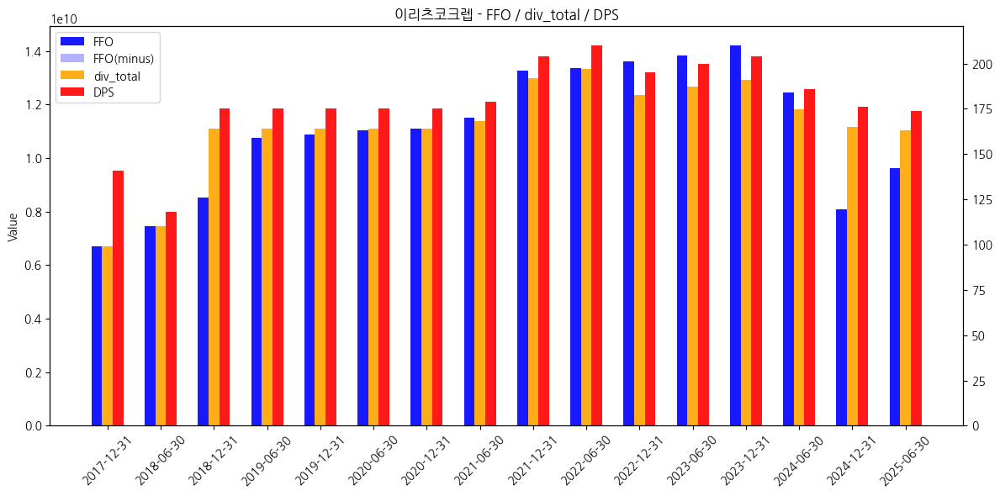

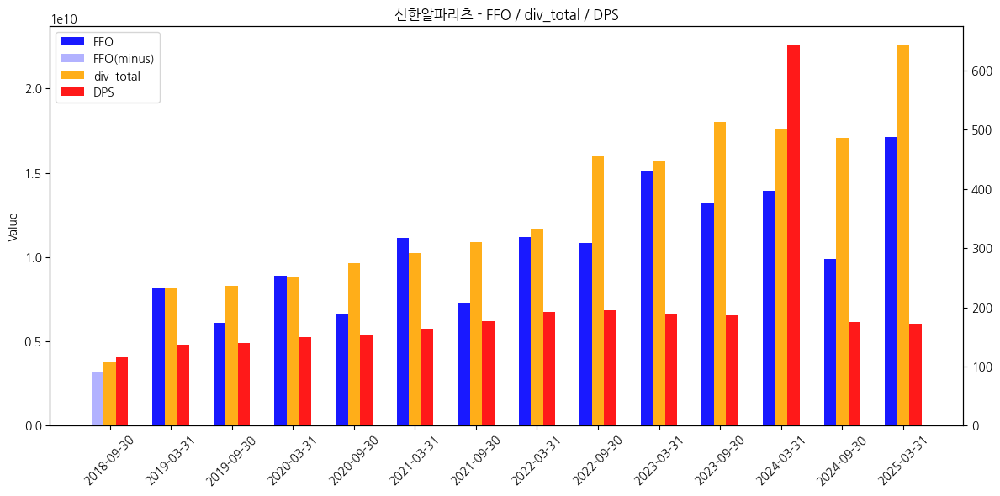

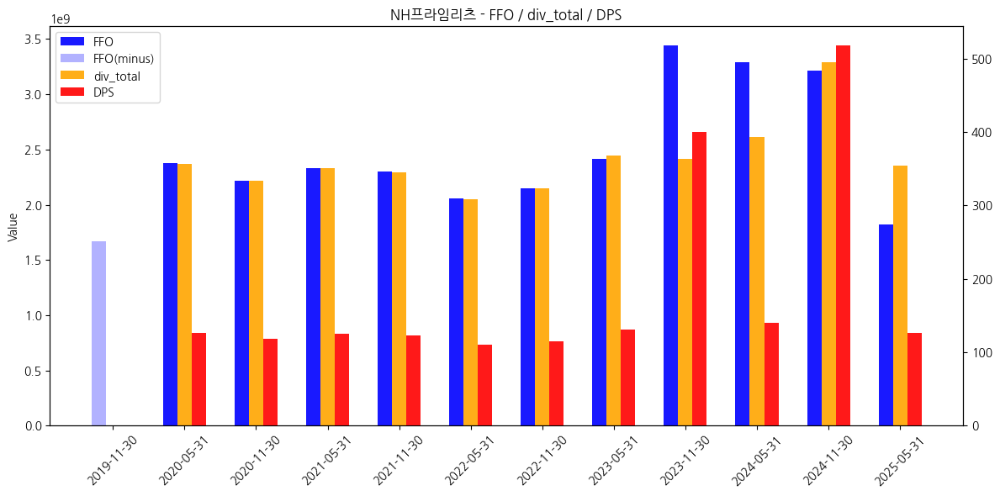

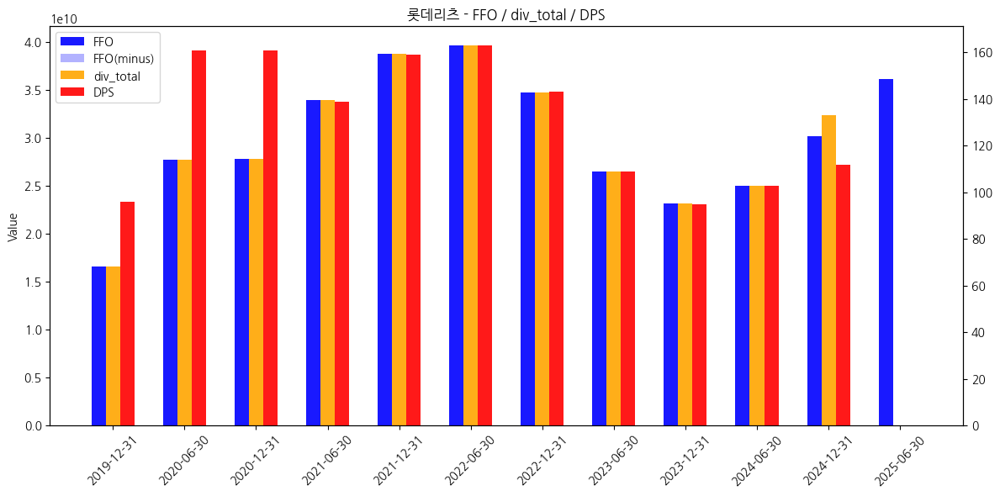

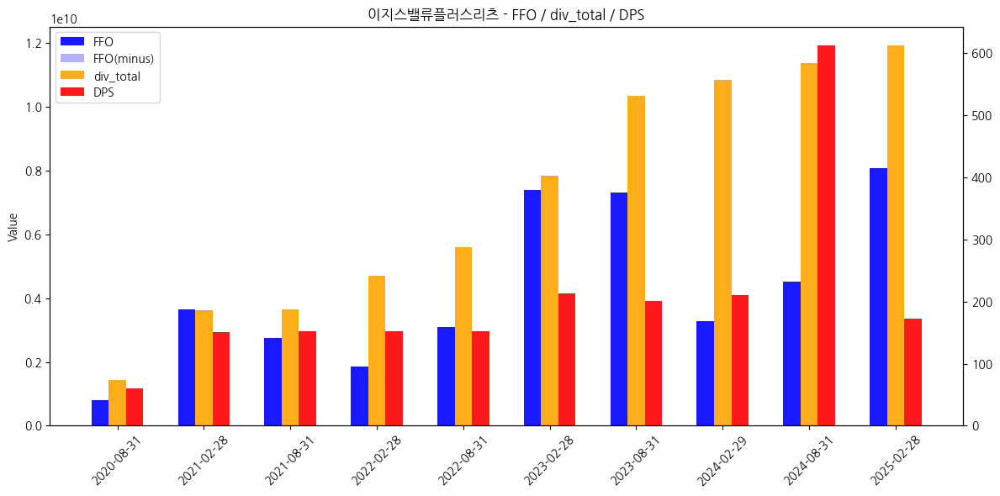

...

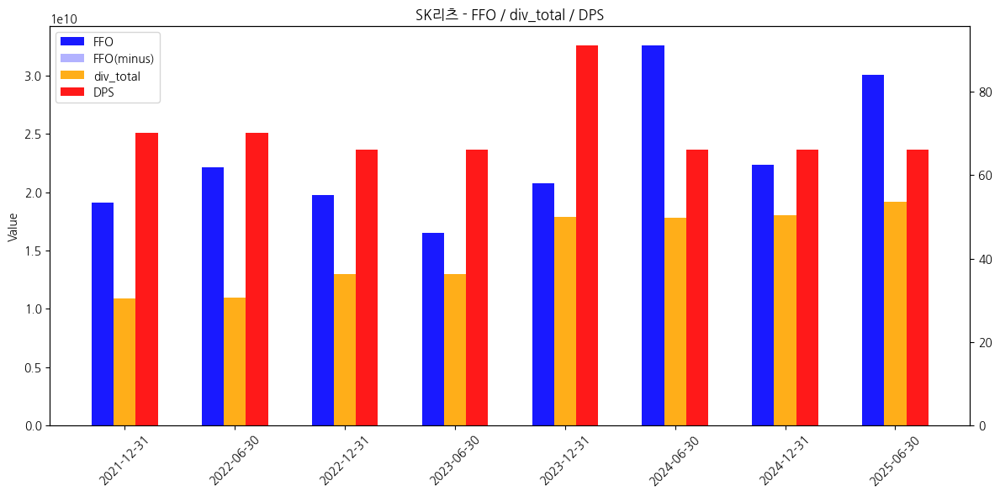

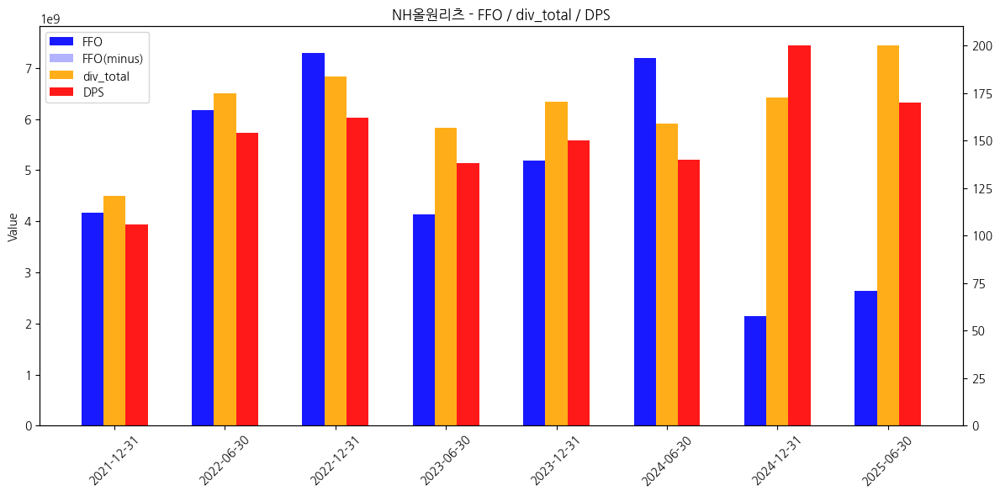

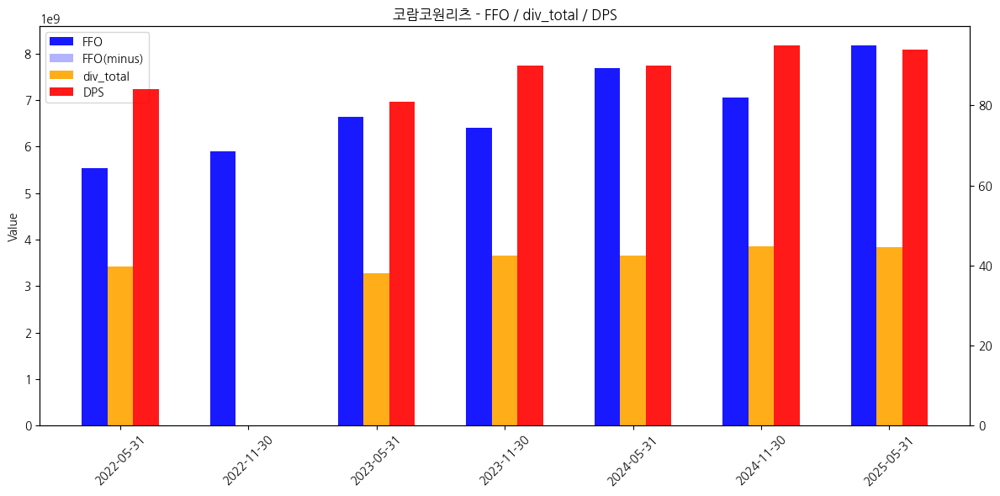

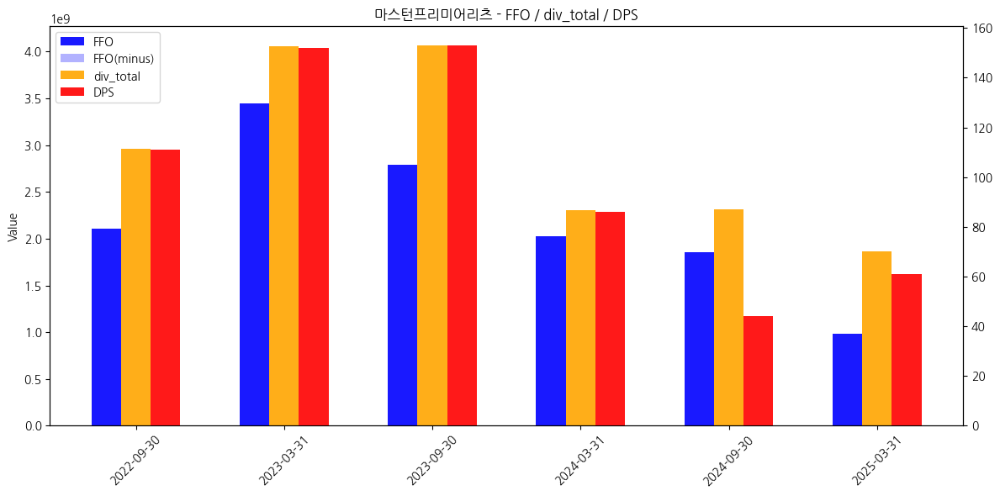

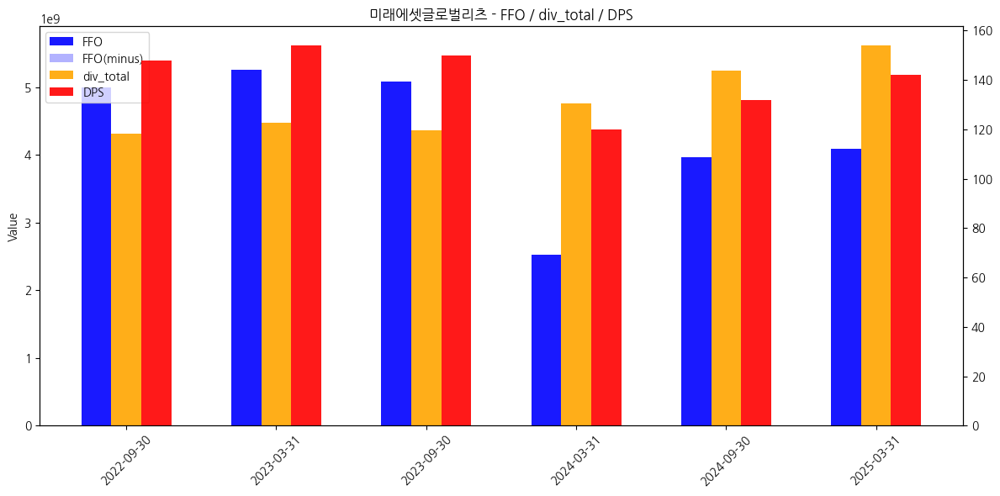

In [248]:
# FFO, 총배당액, 주당배당금 막대그래프 시각화
from matplotlib.patches import Patch

reit_names = list(data['name'].unique())

for name in reit_names:
    temp = data[data['name'] == name].copy()
    temp = temp.sort_values('날짜')

    x = np.arange(len(temp))  # x축 위치
    width = 0.2              # 막대 너비

    fig, ax = plt.subplots(figsize=(12, 6))

    legend_patches = [
        Patch(facecolor='blue', alpha=0.9, label='FFO'),
        Patch(facecolor='blue', alpha=0.3, label='FFO(minus)'),
        Patch(facecolor='orange', alpha=0.9, label='div_total'),
        Patch(facecolor='red', alpha=0.9, label='DPS')
    ]

    ax.legend(handles=legend_patches, loc='upper left')

    # FFO 막대 (루프 돌며 개별 alpha 적용)
    for i, v in enumerate(temp['FFO']):
        if v < 0:
            ax.bar(x[i] - width, abs(v), width, label='FFO(minus)' if i == 0 else "", alpha=0.3, color='blue')
        else:
            ax.bar(x[i] - width, v, width, label='FFO' if i == 0 else "", alpha=0.9, color='blue')

    ax.bar(x, temp['div_total'], color='orange', width=width, label='div_total', alpha=0.9)

    # 오른쪽 y축 그래프
    ax2 = ax.twinx()
    ax2.bar(x + width, temp['div_per_stock'], color='red', width=width, label='DPS', alpha=0.9)

    # x축 날짜 라벨
    ax.set_xticks(x)
    ax.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)

    ax.set_ylabel("Value")
    ax.set_title(f"{name} - FFO / div_total / DPS")

    plt.tight_layout()
    plt.show()

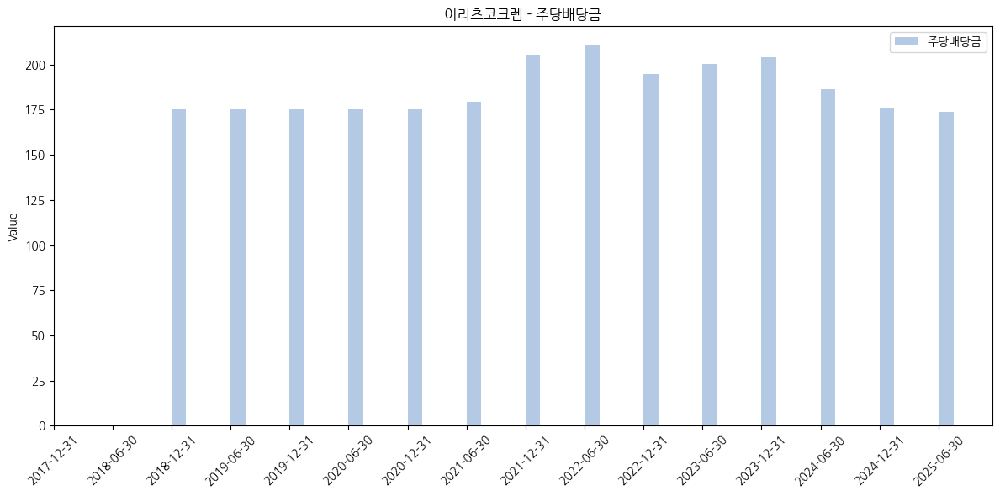

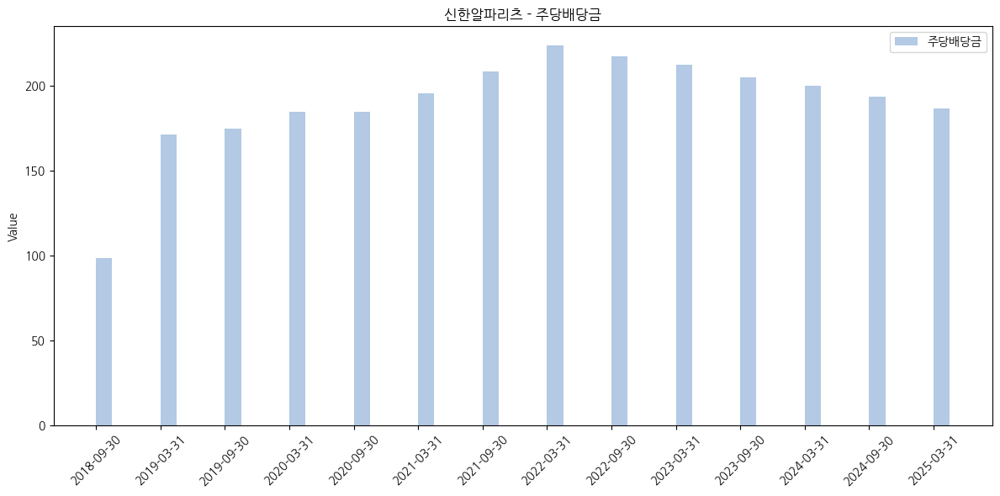

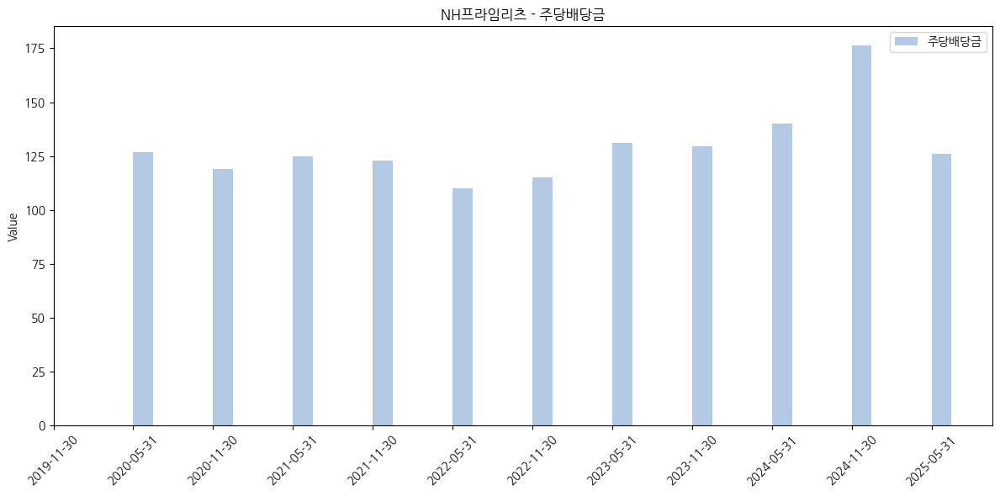

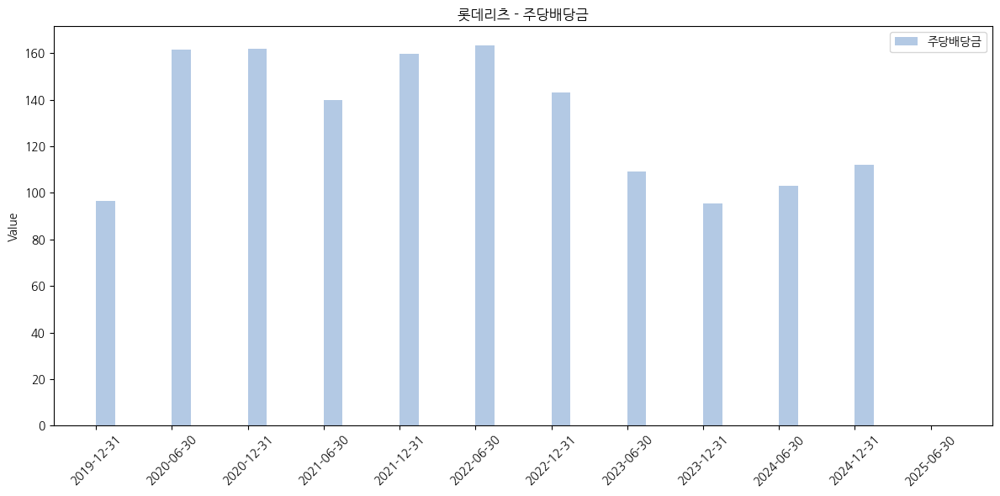

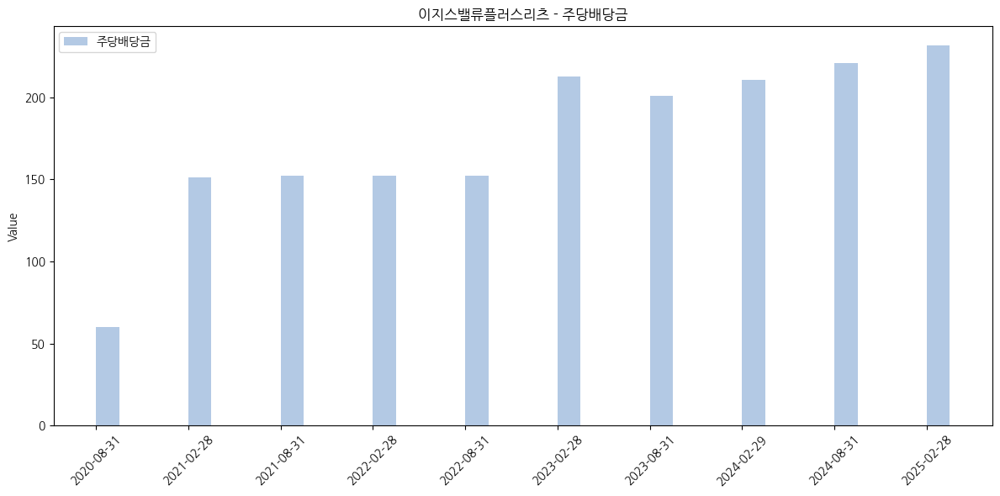

...

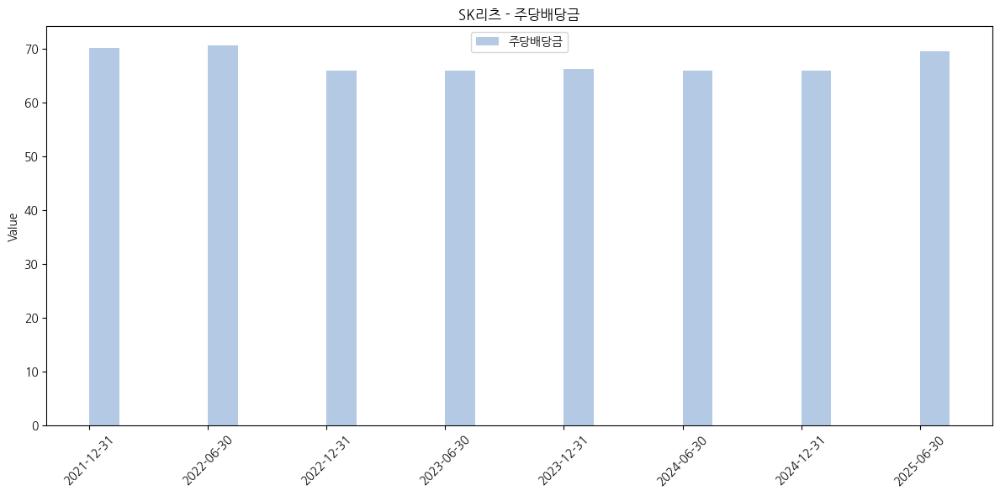

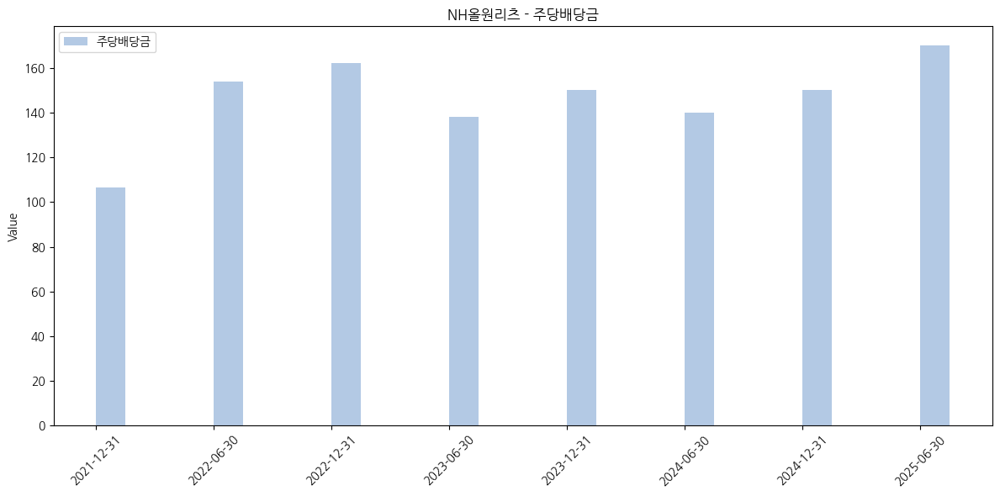

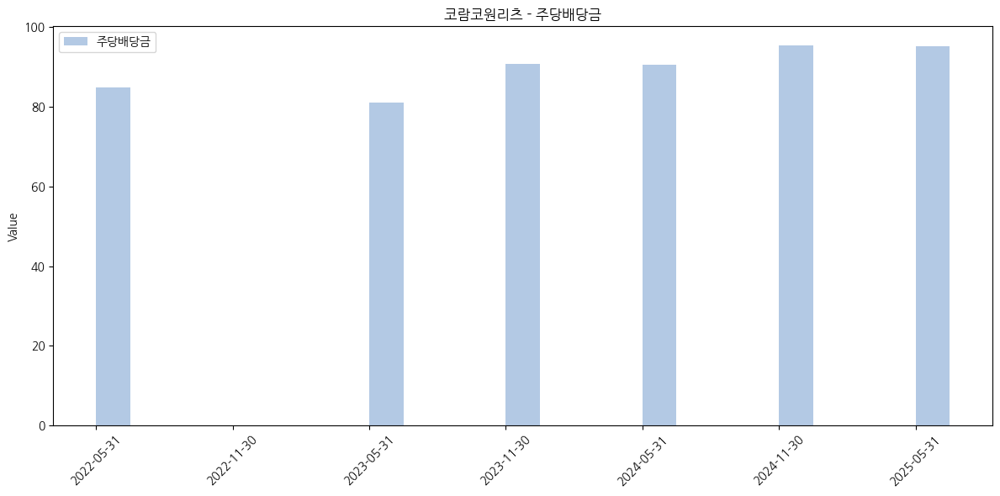

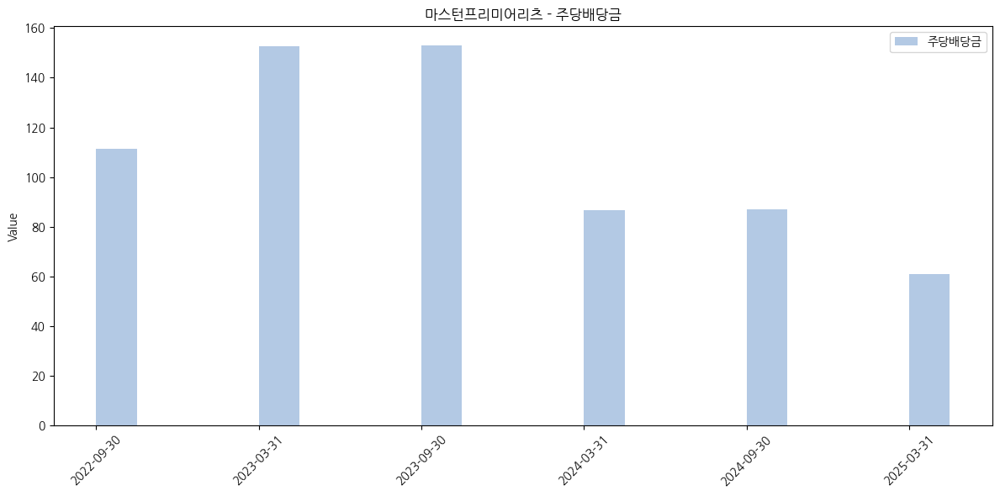

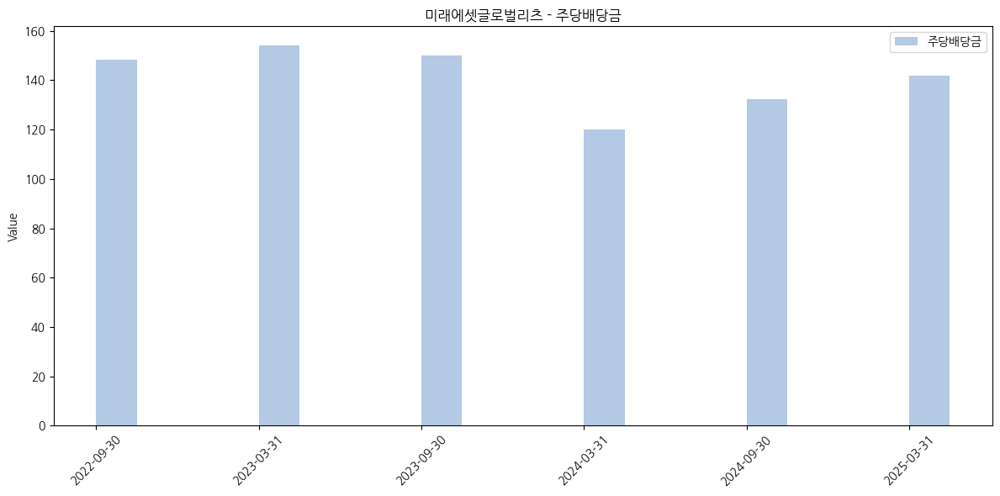

In [338]:
# FFO, 총배당액, 주당배당금 막대그래프 시각화
from matplotlib.patches import Patch

reit_names = list(data['name'].unique())

for name in reit_names:
    temp = data[data['name'] == name].copy()
    temp = temp.sort_values('날짜')

    x = np.arange(len(temp))  # x축 위치
    width = 0.25              # 막대 너비

    fig, ax = plt.subplots(figsize=(12, 6))

    # FFO 막대 (루프 돌며 개별 alpha 적용)
    #ax.bar(x-width/2, temp['FFO_adjusted'], width, label='FFO', alpha=0.7, color="#054DA6")
    ax.bar(x+width/2, temp['주당배당금'], width, label='주당배당금', alpha=0.3, color="#054DA6")

    # x축 날짜 라벨
    ax.set_xticks(x)
    ax.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)

    ax.set_ylabel("Value")
    ax.set_title(f"{name} - 주당배당금")
    ax.legend()

    plt.tight_layout()
    plt.show()

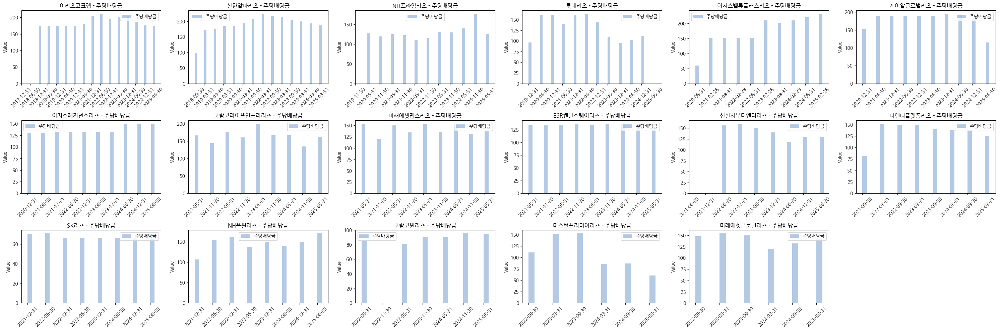

In [339]:
# FFO, 총배당액, 주당배당금 막대그래프 시각화
from matplotlib.patches import Patch

reit_names = list(data['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 6
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(30, 10), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

for i, name in enumerate(reit_names):
    temp = data[data['name'] == name].copy()
    temp = temp.sort_values('날짜')

    x = np.arange(len(temp))  # x축 위치
    width = 0.25              # 막대 너비

    ax = axes[i]

    # FFO 막대 (루프 돌며 개별 alpha 적용)
    #ax.bar(x-width/2, temp['FFO_adjusted'], width, label='FFO', alpha=0.7, color="#054DA6")
    ax.bar(x+width/2, temp['주당배당금'], width, label='주당배당금', alpha=0.3, color="#054DA6")

    # x축 날짜 라벨
    ax.set_xticks(x)
    ax.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)

    ax.set_ylabel("Value")
    ax.set_title(f"{name} - 주당배당금")
    ax.legend()

# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2411084366.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2411084366.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2411084366.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2411084366.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2411084366.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\m

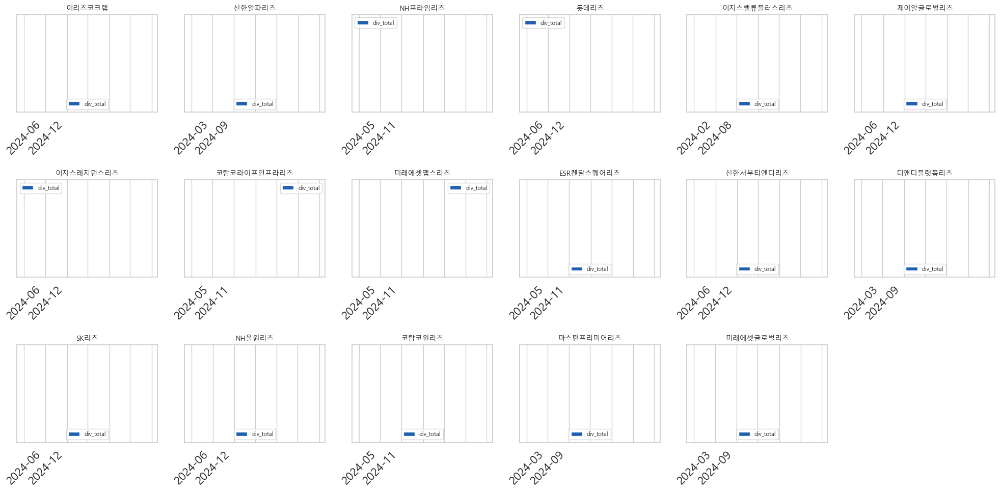

In [522]:
import math

reit_names = list(data_skip2['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 6
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(20, 10), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

for i, name in enumerate(reit_names):
    temp = data_skip2[data_skip2['name'] == name].copy()
    temp = temp.sort_values('날짜')
    temp = temp[(temp['날짜'] >= start_date) & (temp['날짜'] <= end_date)]

    #x = np.arange(len(temp))
    width = 0.2

    '''legend_patches = [
        Patch(facecolor='blue', alpha=0.9, label='FFO'),
        Patch(facecolor='blue', alpha=0.3, label='FFO(minus)'),
        Patch(facecolor='orange', alpha=0.9, label='div_total'),
        Patch(facecolor='red', alpha=0.9, label='DPS')
    ]'''
    ax = axes[i]
    '''for i, v in enumerate(temp['FFO']):
        if v < 0:
            ax.bar(x[i] - width, abs(v), width, label='FFO(minus)' if i == 0 else "", alpha=0.3, color='blue')
        else:
            ax.bar(x[i] - width, v, width, label='FFO' if i == 0 else "", alpha=0.9, color='blue')'''
    ax.bar(temp['날짜'], temp['div_total'], color="#054DA6", width=width, label='div_total', alpha=0.9)

    '''ax2 = ax.twinx()
    ax2.bar(x + width, temp['div_per_stock'], color='red', width=width, label='DPS', alpha=0.9)'''
    ax.set_yticks([])
    ax.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m'), rotation=45)    
    ax.set_title(name, fontsize=10)
    ax.legend(fontsize=8)

# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [264]:
data['주당배당금'] = data['div_total'] / data['stocks']

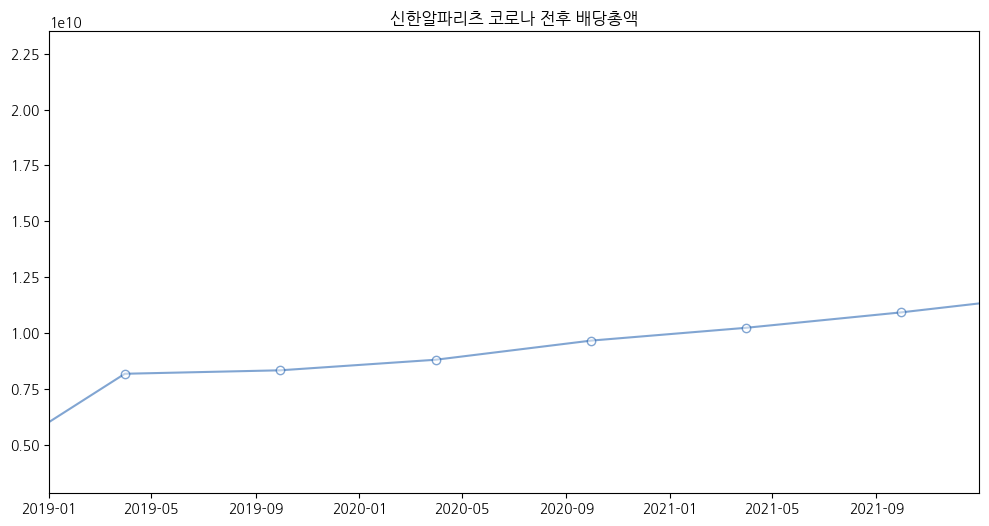

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))

temp = data_skip2[data_skip2['name'] == '신한알파리츠'].copy()
temp = temp.sort_values('날짜')

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2021-12-31")

width = 0.35

ax.plot(
    temp['날짜'], 
    temp['div_total'], 
    marker='o', 
    markersize=6,               # 크기 축소
    markerfacecolor='white',    # 내부 흰색
    markeredgecolor="#054DA6",  # 테두리 색
    color="#054DA6",
    alpha=0.5, 
    label="div_total"
)
ax.set_xlim(start_date, end_date)
plt.title('신한알파리츠 코로나 전후 배당총액')
plt.show()

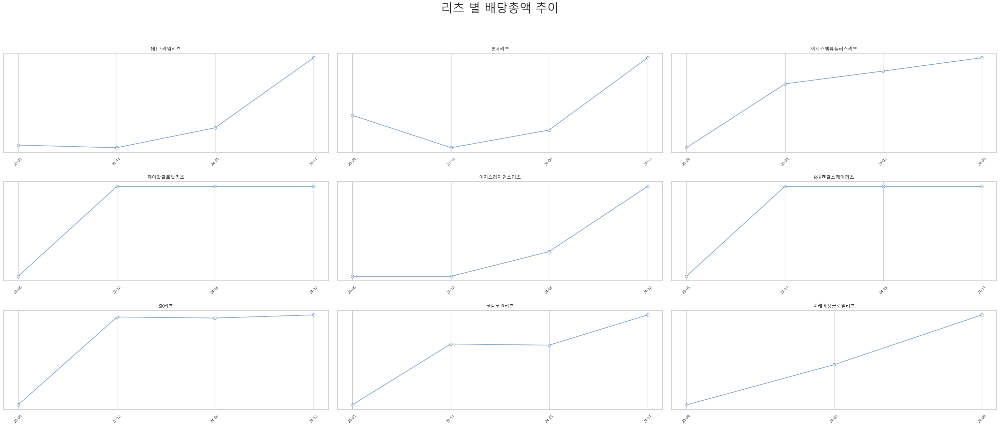

In [529]:
# FFO, 배당총액, 주당배당금 선그래프 시각화
import numpy as np
from matplotlib.patches import Patch

reit_names = [
    'NH프라임리츠',
    '롯데리츠',
    '이지스밸류플러스리츠',
    '제이알글로벌리츠',
    '이지스레지던스리츠',
    'ESR켄달스퀘어리츠',
    'SK리츠',
    '코람코원리츠',
    '미래에셋글로벌리츠'
]
n = len(reit_names)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(30, 13), sharex=False, sharey=False)
axes = axes.flatten()

start_date = pd.to_datetime("2023-01-01")
end_date = pd.to_datetime("2025-01-01")

for idx, name in enumerate(reit_names):
    temp = data_skip2[data_skip2['name'] == name].copy()
    temp = temp.sort_values('날짜')
    temp = temp[(temp['날짜'] >= start_date) & (temp['날짜'] <= end_date)]

    width = 0.35
    
    ax = axes[idx]
    # FFO bar
    '''ax.plot(
        x,
        temp['FFO_adjusted'], 
        marker='o', 
        markersize=6,               # 크기 축소
        markerfacecolor='white',    # 내부 흰색
        markeredgecolor="#054DA6",  # 테두리 색
        color="#054DA6",
        alpha=0.7, 
        label="div_total"
    )'''
    # div_total bar
    ax.plot(
        temp['날짜'], 
        temp['div_total'], 
        marker='o', 
        markersize=6,               # 크기 축소
        markerfacecolor='white',    # 내부 흰색
        markeredgecolor="#054DA6",  # 테두리 색
        color="#054DA6",
        alpha=0.5, 
        label="div_total"
    )
    #DPS
    '''ax2 = ax.twinx()
    ax2.plot(
        x, 
        temp['주당배당금'], 
        marker='o', 
        markersize=6,               # 크기 축소
        markerfacecolor='white',    # 내부 흰색
        markeredgecolor="#93D3D3",  # 테두리 색
        color="#93D3D3",
        alpha=0.9, 
        label="DPS"
    )'''
    # DPS bar on twin axis
    
    #ax2.bar(x + width, temp['div_per_stock'], width=width, color="#05A2E0", alpha=0.9)
    ax.set_title(name, fontsize=10)
    #ax.set_xlim(start_date, end_date)

    # x축, y축 숫자 숨기기
    #ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticks(temp['날짜'])

    # 2. 그 눈금의 날짜 형식을 '년-월'로 변환해서 표시
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m'))

    # 3. 글자가 겹치지 않게 회전
    ax.tick_params(axis='x', rotation=45, labelsize=8)

# 남은 subplot 제거
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

# Legend
legend_patches = [
    #Patch(facecolor="#054DA6", alpha=0.8, label='FFO'),       # 깊은 네이비
    #Patch(facecolor="#054DA6", alpha=0.5, label='배당총액'), # 스틸 블루
    #Patch(facecolor="#BDDBDB", alpha=1.0, label='주당배당금')        # 고급스러운 붉은색
]
#fig.legend(handles=legend_patches, loc='lower right', fontsize=20)
#fig.suptitle('리츠 별 배당총액, 주당배당금 추이', fontsize=25)
fig.suptitle('리츠 별 배당총액 추이', fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()

In [ ]:
name = '신한알파리츠'
temp = data[data['name'] == name][['날짜','div_total']]
temp.to_csv('신한알파리츠 배당금총액.csv')

temp = pd.read_csv('신한알파리츠 배당금총액.csv', encoding='cp949')
temp['날짜'] = pd.to_datetime(temp['날짜'])
temp.loc[temp.index[11], 'div_total'] = 15966453061

temp = temp.sort_values('날짜')

x = np.arange(len(temp))  # x축 위치
width = 0.2              # 막대 너비

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x, temp['div_total'], color='skyblue', width=width, label='div_total', alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)
ax.set_title(f"{name} - 배당금총액")

plt.tight_layout()
plt.show()

FFO, 총배당액, 주당배당금 성장률

In [ ]:
# 성장률 시각화 (주당배당금 추가)
reit_names = list(data_skip2['name'].unique())
width = 60
alpha=0.3

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()

    fig, axes = plt.subplots(1, 3, figsize=(22, 6))  # 1행 2열

    # ------------------ [1] f_g 그래프 ------------------
    ax2 = axes[0]

    # 왼쪽 y축 그래프
    ax2.plot(temp['날짜'], temp['f_g_yoy'], marker='o', color='blue', label='f_g_yoy')
    ax2.plot(temp['날짜'], temp['f_g_2y'], marker='o', color='red', label='f_g_2y')
    ax2.plot(temp['날짜'], temp['f_g_max'], marker='o', color='green', label='f_g_max')
    ax2.axhline(0, color='gray', linestyle='-', linewidth=1, alpha=0.8)
    ax2.set_ylabel('f_g', color='black')

    ax2_2 = ax2.twinx()
    ax2_2.bar(temp['날짜'], temp['FFO'], width=width, alpha=alpha, color='blue', label='FFO')
    ax2_2.set_ylabel('FFO')

    # 범례
    lines1, labels1 = ax2.get_legend_handles_labels()
    lines2, labels2 = ax2_2.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    ax2.set_title(f'{name} — FFO Growth (f_g)')

    # ------------------ [2] d_g 그래프 ------------------    
    ax1 = axes[1]
    # 왼쪽 y축 그래프
    ax1.plot(temp['날짜'], temp['d_g_yoy'], marker='o', color='blue', label='d_g_yoy')
    ax1.plot(temp['날짜'], temp['d_g_2y'], marker='o', color='red', label='d_g_2y')
    ax1.plot(temp['날짜'], temp['d_g_max'], marker='o', color='green', label='d_g_max')
    ax1.axhline(0, color='gray', linestyle='-', linewidth=1, alpha=0.8)
    ax1.set_ylabel('d_g', color='black')
    ax1.tick_params(axis='y', labelcolor='black')

    # 오른쪽 y축 그래프
    ax1_2 = ax1.twinx()
    ax1_2.bar(temp['날짜'], temp['div_total'], width=width, alpha=alpha, color='orange', label='div_total')
    ax1_2.set_ylabel('div_total')

    # 범례
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax1_2.get_legend_handles_labels()

    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    ax1.set_title(f'{name} — Dividend Growth (d_g)')

    # ------------------ [3] dps_g 그래프 ------------------
    ax3 = axes[2]

    # 왼쪽 y축 그래프
    ax3.plot(temp['날짜'], temp['dps_g_yoy'], marker='o', color='blue', label='dps_g_yoy')
    ax3.plot(temp['날짜'], temp['dps_g_2y'], marker='o', color='red', label='dps_g_2y')
    ax3.plot(temp['날짜'], temp['dps_g_max'], marker='o', color='green', label='dps_g_max')
    ax3.axhline(0, color='gray', linestyle='-', linewidth=1, alpha=0.8)
    ax3.set_ylabel('dps_g', color='black')

    ax3_2 = ax3.twinx()
    ax3_2.bar(temp['날짜'], temp['div_per_stock'], width=width, alpha=alpha, color='red', label='DPS')
    ax3_2.set_ylabel('DPS')

    # 범례
    lines1, labels1 = ax3.get_legend_handles_labels()
    lines2, labels2 = ax3_2.get_legend_handles_labels()
    ax3.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    ax3.set_title(f'{name} — DPS Growth (dps_g)')


    # ------------------------------------------------------
    ax1.set_ylim(-0.3, 0.3)  # 5% 여유
    ax2.set_ylim(-0.3, 0.3)
    ax3.set_ylim(-0.3, 0.3)
    # 전체 제목
    plt.suptitle(f'{name} — Growth Visualization (skip 1year after IPO)', fontsize=15)
    plt.tight_layout()
    plt.show()

### 기업 가치 계산

In [ ]:
# 배당성장률(산술평균) 정제 - 정제 기준 변경 가능! (음수는 0 적용 /->/ 최소값을 요구수익률-0.01 으로 적용)
data_skip2['d_g_mmax'] = data_skip2['d_g_mmax'].fillna(0)
data_skip2['f_g_mmax'] = data_skip2['f_g_mmax'].fillna(0)
data_skip2['dps_g_mmax'] = data_skip2['dps_g_mmax'].fillna(0)

data_skip2['d_g_mmax'] = data_skip2['d_g_mmax'].clip(lower=0)
data_skip2['f_g_mmax'] = data_skip2['f_g_mmax'].clip(lower=0)
data_skip2['dps_g_mmax'] = data_skip2['dps_g_mmax'].clip(lower=0)

data_skip2['d_g_mmax'] = data_skip2['d_g_mmax'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)
data_skip2['f_g_mmax'] = data_skip2['f_g_mmax'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)
data_skip2['dps_g_mmax'] = data_skip2['dps_g_mmax'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)

In [ ]:
# 배당성장률(기하평균) 정제 - 정제 기준 변경 가능! (음수는 0 적용 /->/ 최소값을 요구수익률-0.01 으로 적용)
data_skip2['d_g_max'] = data_skip2['d_g_max'].fillna(0)
data_skip2['f_g_max'] = data_skip2['f_g_max'].fillna(0)
data_skip2['dps_g_max'] = data_skip2['dps_g_max'].fillna(0)

data_skip2['d_g_max'] = data_skip2['d_g_max'].clip(lower=0)
data_skip2['f_g_max'] = data_skip2['f_g_max'].clip(lower=0)
data_skip2['dps_g_max'] = data_skip2['dps_g_max'].clip(lower=0)

data_skip2['d_g_max'] = data_skip2['d_g_max'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)
data_skip2['f_g_max'] = data_skip2['f_g_max'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)
data_skip2['dps_g_max'] = data_skip2['dps_g_max'].combine(
    data_skip2['요구수익률'] - 0.01,
    func=min
)

In [ ]:
# 기업가치 계산 (산술평균)
data_skip2['DCF_m'] = data_skip2['FFO']*(1+data_skip2['f_g_mmax']) / (data_skip2['요구수익률'] - data_skip2['f_g_mmax'])
data_skip2['DDM_m'] = data_skip2['div_total']*(1+data_skip2['d_g_mmax']) / (data_skip2['요구수익률'] - data_skip2['d_g_mmax'])

data_skip2['DCF_m/stocks'] = data_skip2['DCF_m'] / data_skip2['stocks']
data_skip2['DDM_m/stocks'] = data_skip2['DDM_m'] / data_skip2['stocks']

In [ ]:
# 기업가치 계산 (기하평균)
data_skip2['DCF'] = data_skip2['FFO_adjusted']*(1+data_skip2['f_g_max']) / (data_skip2['요구수익률'] - data_skip2['f_g_max'])
data_skip2['DDM'] = data_skip2['div_total']*(1+data_skip2['d_g_max']) / (data_skip2['요구수익률'] - data_skip2['d_g_max'])

data_skip2['DCF/stocks'] = data_skip2['DCF'] / data_skip2['stocks']
data_skip2['DDM/stocks'] = data_skip2['DDM'] / data_skip2['stocks']
data_skip2['DDM_dpsg/stocks'] = data_skip2['div_per_stock']*(1 + data_skip2['dps_g_max']) / (data_skip2['요구수익률'] - data_skip2['dps_g_max'])

In [ ]:
# 요구수익률 (CAPM only)
# 기업가치 계산 (기대인플레이션)
data['DCF_infl'] = data['FFO_rec']*(1+data['기대인플레이션']) / (data['요구수익률'] - data['기대인플레이션'])
data['DDM_infl'] = data['div_rec']*(1+data['기대인플레이션']) / (data['요구수익률'] - data['기대인플레이션'])

data['DCF_infl/stocks'] = data['DCF_infl'] / data['stocks']
data['DDM_infl/stocks'] = data['DDM_infl'] / data['stocks']

# 기업가치 계산 (기대인플레이션)
data_skip2['DCF_infl'] = data_skip2['FFO_rec']*(1+data_skip2['기대인플레이션']) / (data_skip2['요구수익률'] - data_skip2['기대인플레이션'])
data_skip2['DDM_infl'] = data_skip2['div_rec']*(1+data_skip2['기대인플레이션']) / (data_skip2['요구수익률'] - data_skip2['기대인플레이션'])

data_skip2['DCF_infl/stocks'] = data_skip2['DCF_infl'] / data_skip2['stocks']
data_skip2['DDM_infl/stocks'] = data_skip2['DDM_infl'] / data_skip2['stocks']

# 기업가치 계산 (g=0)
data['DCF_g0'] = data['FFO_rec'] / (data['요구수익률'])
data['DDM_g0'] = data['div_rec'] / (data['요구수익률'])

data['DCF_g0/stocks'] = data['DCF_g0'] / data['stocks']
data['DDM_g0/stocks'] = data['DDM_g0'] / data['stocks']

# 기업가치 계산 (g=0)
data_skip2['DCF_g0'] = data_skip2['FFO_rec'] / (data_skip2['요구수익률'])
data_skip2['DDM_g0'] = data_skip2['div_rec'] / (data_skip2['요구수익률'])

data_skip2['DCF_g0/stocks'] = data_skip2['DCF_g0'] / data_skip2['stocks']
data_skip2['DDM_g0/stocks'] = data_skip2['DDM_g0'] / data_skip2['stocks']

In [276]:
# 요구수익률 (신용프리미엄 추가)
# 기업가치 계산 (기대인플레이션)
data['DCF_crpr_infl'] = data['FFO_rec']*(1+data['기대인플레이션']) / (data['요구수익률_신용프리미엄'] - data['기대인플레이션'])
data['DDM_crpr_infl'] = data['div_rec']*(1+data['기대인플레이션']) / (data['요구수익률_신용프리미엄'] - data['기대인플레이션'])

data['DCF_crpr_infl/stocks'] = data['DCF_crpr_infl'] / data['stocks']
data['DDM_crpr_infl/stocks'] = data['DDM_crpr_infl'] / data['stocks']

# 기업가치 계산 (기대인플레이션)
data_skip2['DCF_crpr_infl'] = data_skip2['FFO_rec']*(1+data_skip2['기대인플레이션']) / (data_skip2['요구수익률_신용프리미엄'] - data_skip2['기대인플레이션'])
data_skip2['DDM_crpr_infl'] = data_skip2['div_rec']*(1+data_skip2['기대인플레이션']) / (data_skip2['요구수익률_신용프리미엄'] - data_skip2['기대인플레이션'])

data_skip2['DCF_crpr_infl/stocks'] = data_skip2['DCF_crpr_infl'] / data_skip2['stocks']
data_skip2['DDM_crpr_infl/stocks'] = data_skip2['DDM_crpr_infl'] / data_skip2['stocks']

# 기업가치 계산 (g=0)
data['DCF_crpr_g0'] = data['FFO_rec'] / (data['요구수익률_신용프리미엄'])
data['DDM_crpr_g0'] = data['div_rec'] / (data['요구수익률_신용프리미엄'])

data['DCF_crpr_g0/stocks'] = data['DCF_crpr_g0'] / data['stocks']
data['DDM_crpr_g0/stocks'] = data['DDM_crpr_g0'] / data['stocks']

# 기업가치 계산 (g=0)
data_skip2['DCF_crpr_g0'] = data_skip2['FFO_rec'] / (data_skip2['요구수익률_신용프리미엄'])
data_skip2['DDM_crpr_g0'] = data_skip2['div_rec'] / (data_skip2['요구수익률_신용프리미엄'])

data_skip2['DCF_crpr_g0/stocks'] = data_skip2['DCF_crpr_g0'] / data_skip2['stocks']
data_skip2['DDM_crpr_g0/stocks'] = data_skip2['DDM_crpr_g0'] / data_skip2['stocks']

### 기업 가치 관련 시각화

기업가치 DCF, DDM (과거 성장률 기반 vs 기대 인플레이션 기반)

In [ ]:
# 기업가치 DCF, DDM (과거 성장률 기반 vs 기대 인플레이션 기반)
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()

    fig, axes = plt.subplots(1, 2, figsize=(22, 6))  # 1행 2열

    # ------------------ [2] f_g 그래프 ------------------
    ax1 = axes[0]

    x = np.arange(len(temp))  # x축 위치
    width = 0.2              # 막대 너비

    # 두 개의 막대를 나란히 배치
    ax1.bar(x - width, temp['DCF'], width, label='DCF')
    ax1.bar(x, temp['DDM'], width, label='DDM')
    ax1.bar(x + width, temp['DDM_dpsg'], width, label='DDM_dpsg')

    # x축 날짜 라벨
    ax1.set_xticks(x)
    ax1.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)

    ax1.set_ylabel("Value")
    ax1.set_title(f"{name} - Valuation by past growth rate")
    ax1.legend()

    # ------------------ [1] d_g 그래프 ------------------    
    ax2 = axes[1]

    # 두 개의 막대를 나란히 배치
    ax2.bar(x - width/2, temp['DCF_infl'], width, label='DCF_infl')
    ax2.bar(x + width/2, temp['DDM_infl'], width, label='DDM_infl')

    # x축 날짜 라벨
    ax2.set_xticks(x)
    ax2.set_xticklabels(temp['날짜'].dt.strftime('%Y-%m-%d'), rotation=45)

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation by expected inflation")
    ax2.legend()

    max_val = max(temp[['DCF','DDM','DCF_infl','DDM_infl']].max())
    ax1.set_ylim(0, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(0, max_val * 1.05)
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation past_rate vs expected inflation (skip 1year after IPO)', fontsize=15)
    plt.tight_layout()
    plt.show()

주당 기업가치 DCF, DDM (과거 성장률 기반 vs 기대 인플레이션 기반)

In [ ]:
# 주당 기업가치 DCF, DDM (과거 성장률 기반 vs 기대 인플레이션 기반)
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF/stocks'] = temp['DCF/stocks'].ffill()
    temp['DDM/stocks'] = temp['DDM/stocks'].ffill()
    temp['DCF_infl/stocks'] = pd.to_numeric(temp['DCF_infl/stocks'], errors='coerce').ffill()
    temp['DDM_infl/stocks'] = pd.to_numeric(temp['DDM_infl/stocks'], errors='coerce').ffill()

    fig, axes = plt.subplots(1, 2, figsize=(22, 6))  # 1행 2열

    # ------------------ [1] 과거 성장률 기반 그래프 ------------------
    ax1 = axes[0]

    # 두 개의 막대를 나란히 배치
    ax1.plot(temp['날짜'], temp['DCF/stocks'], label='DCF/stocks')
    ax1.plot(temp['날짜'], temp['DDM/stocks'], label='DDM/stocks')
    ax1.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax1.set_ylabel("Value")
    ax1.set_title(f"{name} - Valuation/stocks by past growth rate")
    ax1.legend()

    # x축 라벨
    ax1.set_xlabel('Date')

    # ------------------ [2] 기대인플레이션 기반 그래프 ------------------    
    ax2 = axes[1]

    # 두 개의 막대를 나란히 배치
    ax2.plot(temp['날짜'], temp['DCF_infl/stocks'], label='DCF_infl/stocks')
    ax2.plot(temp['날짜'], temp['DDM_infl/stocks'], label='DDM_infl/stocks')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation/stocks by expected inflation")
    ax2.legend()

    # x축 라벨
    ax2.set_xlabel('Date')

    max_val = max(temp[['DCF/stocks','DDM/stocks','Close']].max())
    min_val = min(temp[['DCF/stocks','DDM/stocks','Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유

    max_val = max(temp[['DCF_infl/stocks','DDM_infl/stocks','Close']].max())
    min_val = min(temp[['DCF_infl/stocks','DDM_infl/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)

    '''max_val = max(temp[['Close']].max())
    min_val = min(temp[['Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유'''
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation/stocks past_rate vs expected inflation (skip 1year after IPO)', fontsize=15)
    plt.tight_layout()
    plt.show()

In [ ]:
temp = data[data['name']=='롯데리츠'].copy()
temp[['날짜','name','요구수익률','기대인플레이션','div_per_stock','DDM_infl/stocks']]

In [ ]:
# 주당 기업가치 DCF, DDM (기대 인플레이션 기반)
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_infl/stocks'] = pd.to_numeric(temp['DCF_infl/stocks'], errors='coerce').ffill()
    temp['DDM_infl/stocks'] = pd.to_numeric(temp['DDM_infl/stocks'], errors='coerce').ffill()

    fig, ax2 = plt.subplots(figsize=(11, 6))

    # ------------------ 기대인플레이션 기반 그래프 ------------------    

    # 두 개의 막대를 나란히 배치
    ax2.plot(temp['날짜'], temp['DCF_infl/stocks'], label='DCF_infl/stocks')
    ax2.plot(temp['날짜'], temp['DDM_infl/stocks'], label='DDM_infl/stocks')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation/stocks by expected inflation")
    ax2.legend()

    # x축 라벨
    ax2.set_xlabel('Date')

    max_val = max(temp[['DCF_infl/stocks','DDM_infl/stocks','Close']].max())
    min_val = min(temp[['DCF_infl/stocks','DDM_infl/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)

    '''max_val = max(temp[['Close']].max())
    min_val = min(temp[['Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유'''
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation/stocks expected inflation', fontsize=15)
    plt.tight_layout()
    plt.show()

In [ ]:
# 주당 기업가치 DCF, DDM (g=0)
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_g0/stocks'] = pd.to_numeric(temp['DCF_g0/stocks'], errors='coerce').ffill()
    temp['DDM_g0/stocks'] = pd.to_numeric(temp['DDM_g0/stocks'], errors='coerce').ffill()

    fig, ax2 = plt.subplots(figsize=(11, 6))

    # ------------------ 기대인플레이션 기반 그래프 ------------------    

    # 두 개의 막대를 나란히 배치
    ax2.plot(temp['날짜'], temp['DCF_g0/stocks'], label='DCF_g0/stocks')
    ax2.plot(temp['날짜'], temp['DDM_g0/stocks'], label='DDM_g0/stocks')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation/stocks by g=0")
    ax2.legend()

    # x축 라벨
    ax2.set_xlabel('Date')

    max_val = max(temp[['DCF_g0/stocks','DDM_g0/stocks','Close']].max())
    min_val = min(temp[['DCF_g0/stocks','DDM_g0/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)

    '''max_val = max(temp[['Close']].max())
    min_val = min(temp[['Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유'''
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation/stocks g=0', fontsize=15)
    plt.tight_layout()
    plt.show()

In [ ]:
# 주당 기업가치 DCF, DDM (g=0) + 신용프리미엄
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_crpr_g0/stocks'] = pd.to_numeric(temp['DCF_crpr_g0/stocks'], errors='coerce').ffill()
    temp['DDM_crpr_g0/stocks'] = pd.to_numeric(temp['DDM_crpr_g0/stocks'], errors='coerce').ffill()

    fig, ax2 = plt.subplots(figsize=(11, 6))

    # ------------------ 기대인플레이션 기반 그래프 ------------------    

    # 두 개의 막대를 나란히 배치
    ax2.plot(temp['날짜'], temp['DCF_crpr_g0/stocks'], label='DCF_crpr_g0/stocks')
    ax2.plot(temp['날짜'], temp['DDM_crpr_g0/stocks'], label='DDM_crpr_g0/stocks')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation/stocks by g=0 (+credit premium)")
    ax2.legend()

    # x축 라벨
    ax2.set_xlabel('Date')

    max_val = max(temp[['DCF_crpr_g0/stocks','DDM_crpr_g0/stocks','Close']].max())
    min_val = min(temp[['DCF_crpr_g0/stocks','DDM_crpr_g0/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)

    '''max_val = max(temp[['Close']].max())
    min_val = min(temp[['Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유'''
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation/stocks g=0 (+credit premium)', fontsize=15)
    plt.tight_layout()
    plt.show()

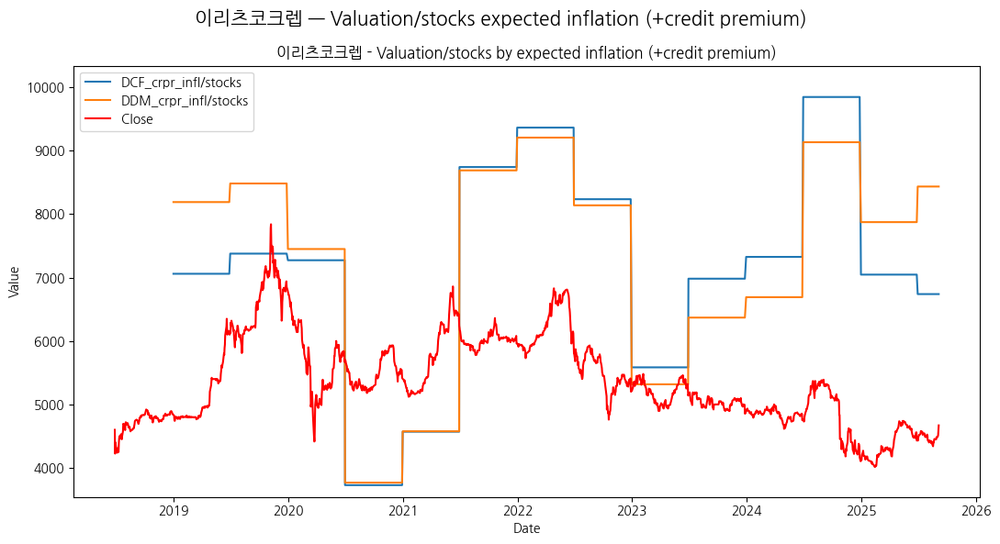

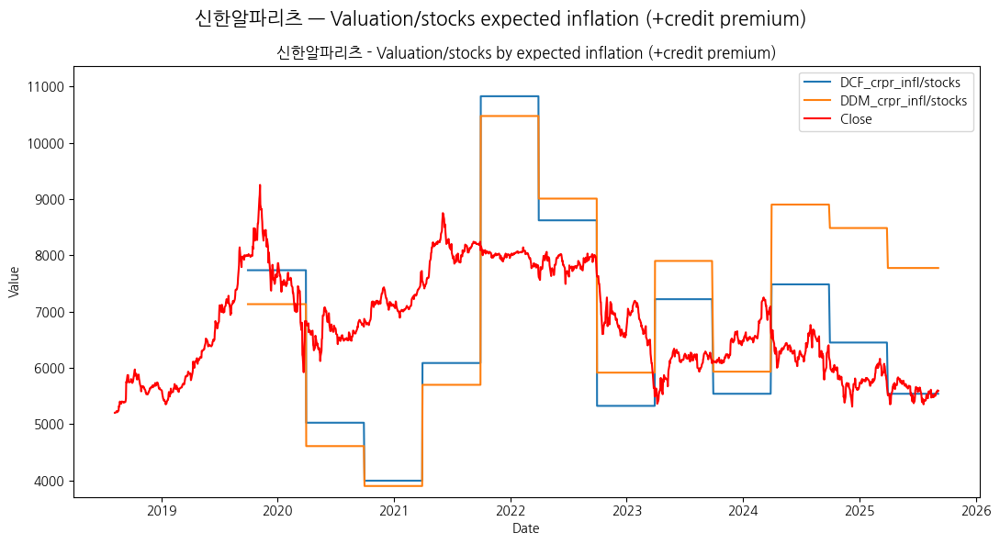

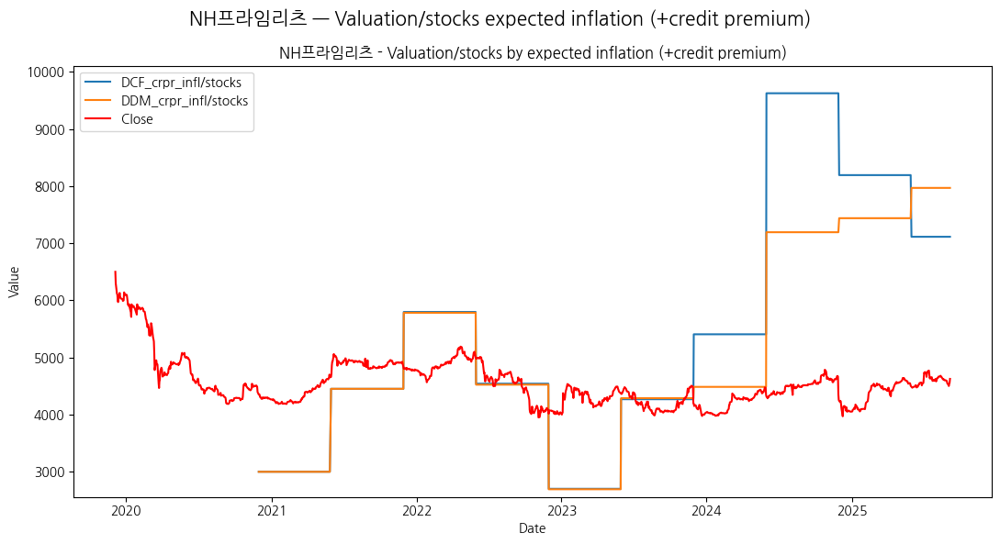

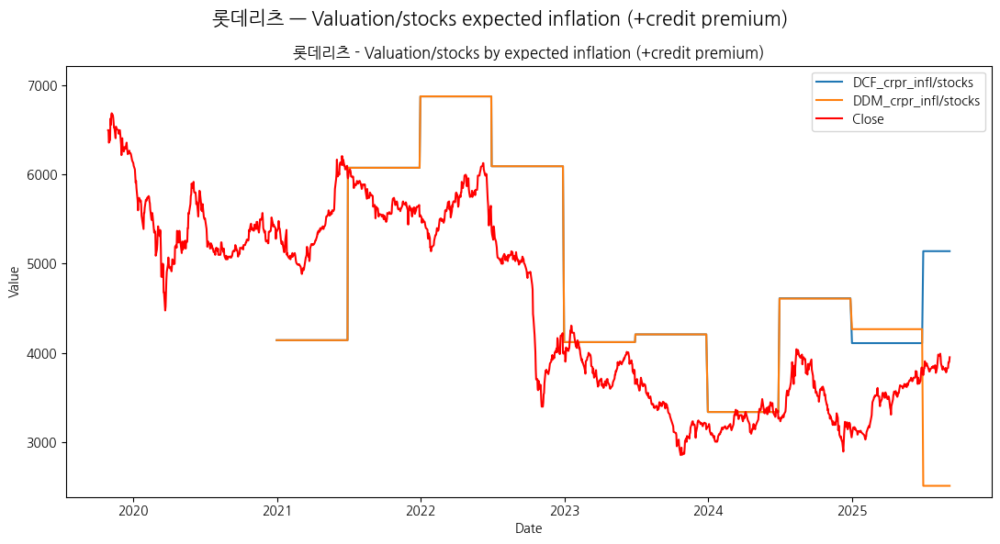

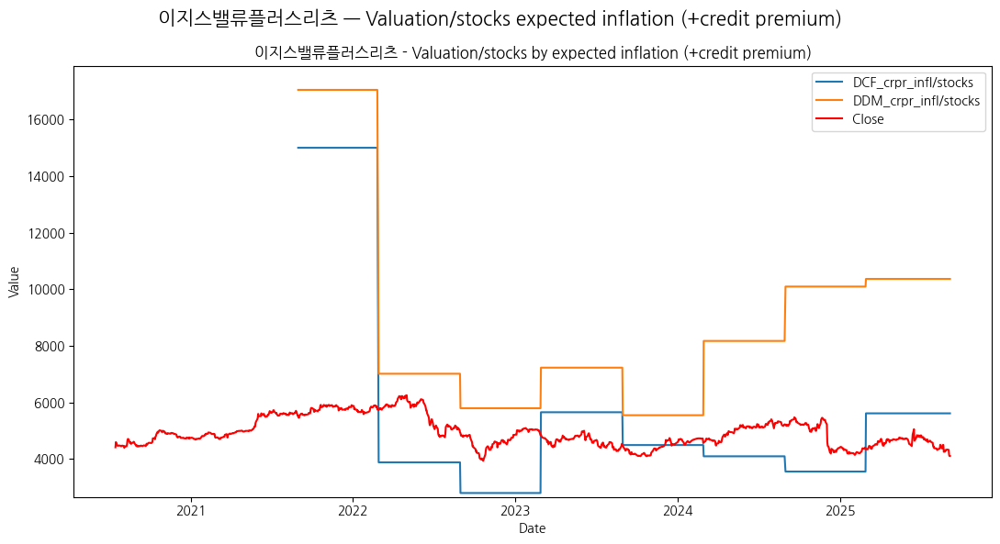

...

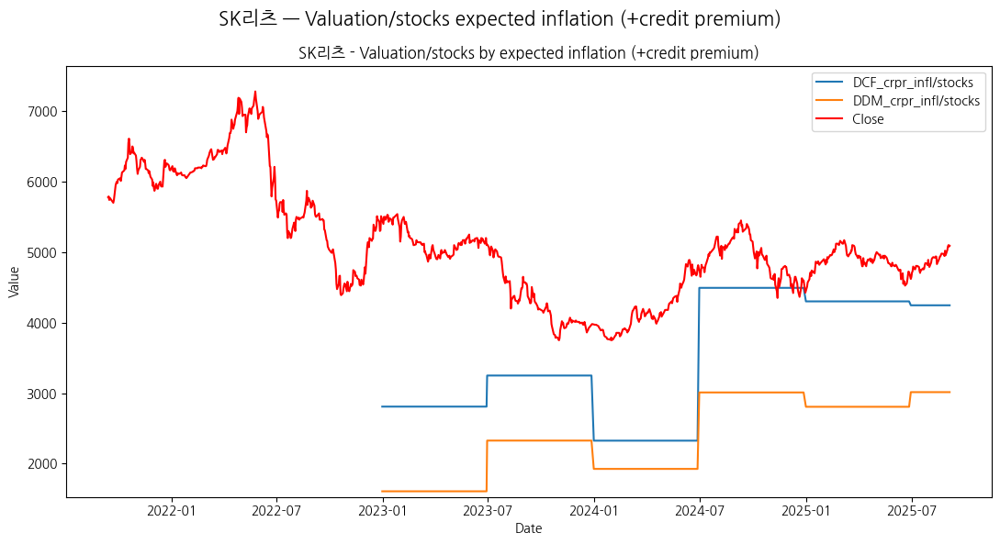

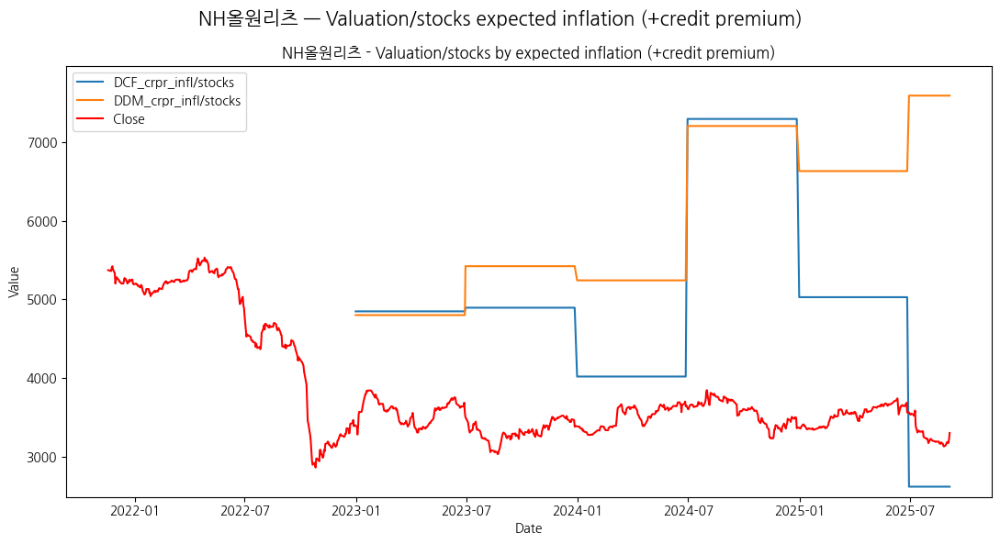

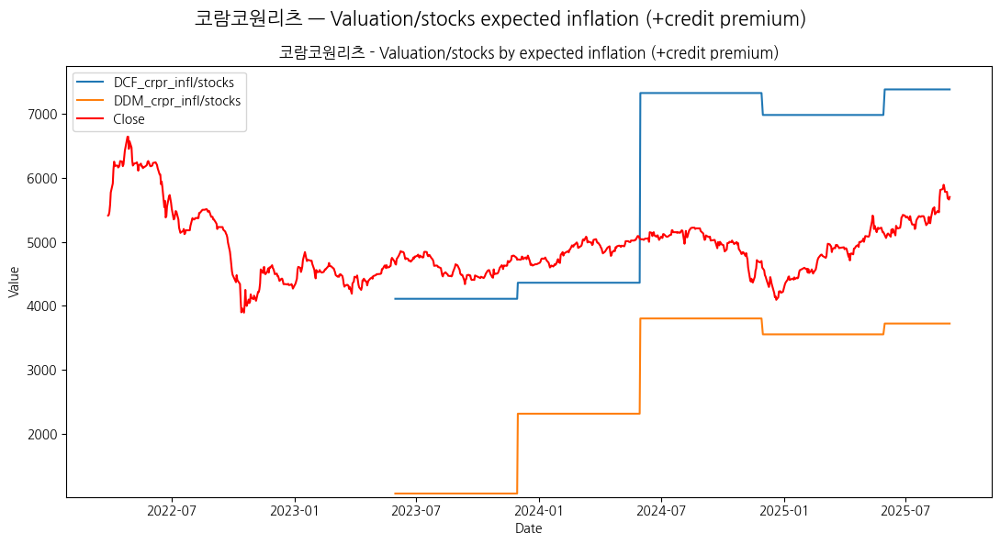

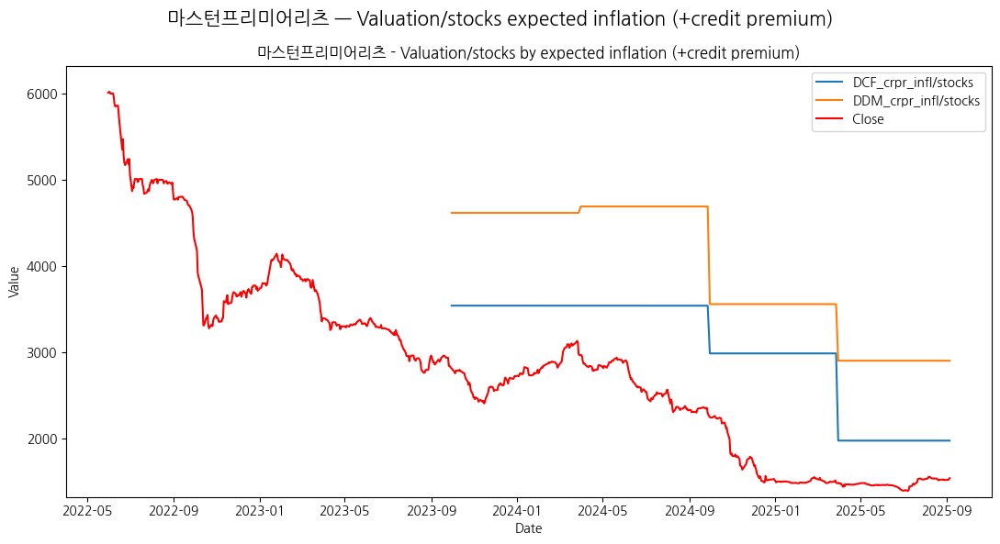

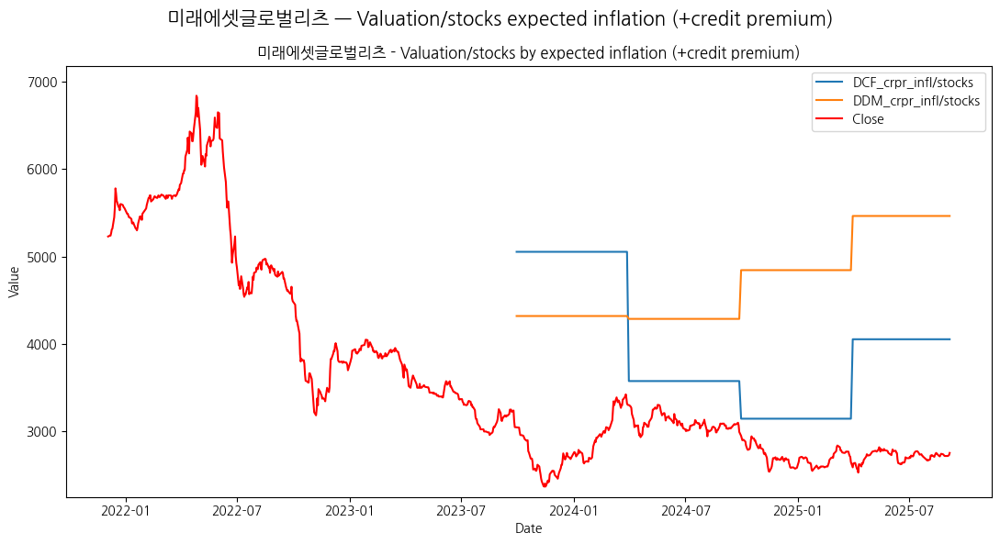

In [ ]:
# 주당 기업가치 DCF, DDM (기대 인플레이션 기반) + 신용프리미엄
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_crpr_infl/stocks'] = pd.to_numeric(temp['DCF_crpr_infl/stocks'], errors='coerce').ffill()
    temp['DDM_crpr_infl/stocks'] = pd.to_numeric(temp['DDM_crpr_infl/stocks'], errors='coerce').ffill()

    fig, ax2 = plt.subplots(figsize=(11, 6))

    # ------------------ 기대인플레이션 기반 그래프 ------------------    

    # 두 개의 막대를 나란히 배치
    ax2.plot(temp['날짜'], temp['DCF_crpr_infl/stocks'], label='DCF_crpr_infl/stocks')
    ax2.plot(temp['날짜'], temp['DDM_crpr_infl/stocks'], label='DDM_crpr_infl/stocks')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='red', label='Close')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name} - Valuation/stocks by expected inflation (+credit premium)")
    ax2.legend()

    # x축 라벨
    ax2.set_xlabel('Date')

    max_val = max(temp[['DCF_crpr_infl/stocks','DDM_crpr_infl/stocks','Close']].max())
    min_val = min(temp[['DCF_crpr_infl/stocks','DDM_crpr_infl/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)

    '''max_val = max(temp[['Close']].max())
    min_val = min(temp[['Close']].min())
    ax1.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유'''
    
    # 전체 제목
    plt.suptitle(f'{name} — Valuation/stocks expected inflation (+credit premium)', fontsize=15)
    plt.tight_layout()
    plt.show()

In [ ]:
len(reit_names)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6145 entries, 0 to 6144
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   변환          6145 non-null   datetime64[ns]
 1   국고채(3년)     6145 non-null   float64       
 2   회사채         6145 non-null   float64       
 3   Unnamed: 3  6145 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 192.2 KB


<Axes: >

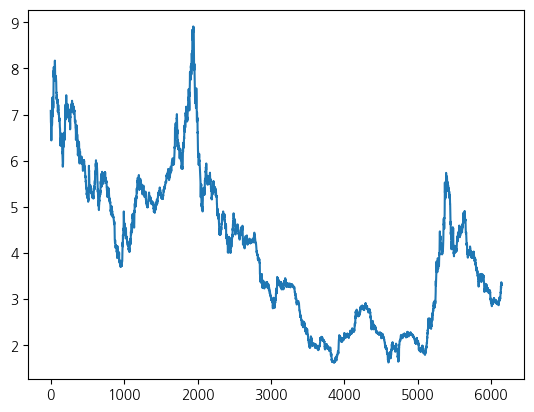

In [236]:
interests['회사채'].plot()

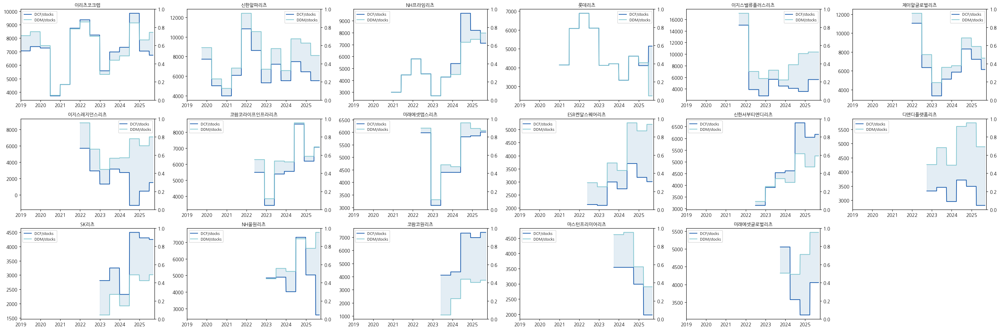

In [ ]:
# DCF, DDM 기업가치 계산 최종결과
import math
import matplotlib.dates as mdates
import datetime as dt

reit_names = list(data_skip2['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 6
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(30, 10), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2025-10-01")

for i, name in enumerate(reit_names):
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]

    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')
    temp = pd.merge(temp, interests[['변환','회사채']], left_on='일자', right_on='변환', how='left')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_crpr_infl/stocks'] = pd.to_numeric(temp['DCF_crpr_infl/stocks'], errors='coerce').ffill()
    temp['DDM_crpr_infl/stocks'] = pd.to_numeric(temp['DDM_crpr_infl/stocks'], errors='coerce').ffill()

    ax = axes[i]
    ax.plot(temp['날짜'], temp['DCF_crpr_infl/stocks'], label='DCF/stocks', color="#054DA6", alpha=0.9)
    ax.plot(temp['날짜'], temp['DDM_crpr_infl/stocks'], label='DDM/stocks', color="#78C3CD", alpha=0.9)
    ax.fill_between(
        temp['날짜'],
        temp['DCF_crpr_infl/stocks'],
        temp['DDM_crpr_infl/stocks'],
        color="#A3C4DC",
        alpha=0.3
    )
    ax1 = ax.twinx()
    #ax1.plot(temp['날짜'], temp['회사채'], color='black')
    #ax1.axvline(dt.datetime(2022, 11, 1), color='black', linestyle='--', linewidth=1)
    ax.set_xlim(start_date, end_date)
    ax1.set_xlim(start_date, end_date)
    ax.set_title(name, fontsize=10)
    ax.legend(fontsize=8)


# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
e_return

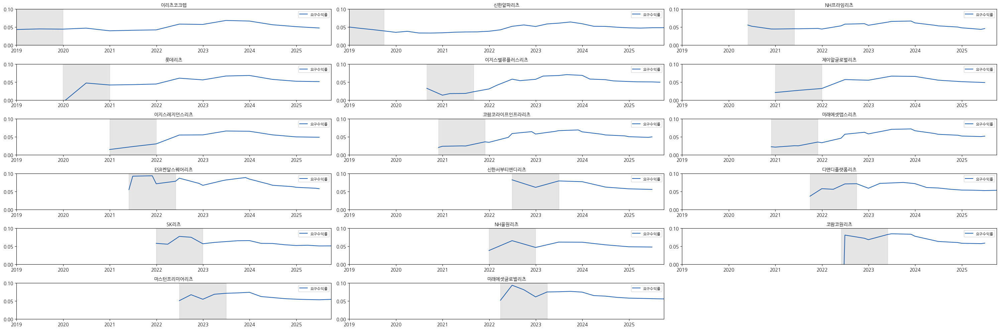

In [400]:
# DCF, DDM 기업가치 계산 최종결과
import math
import matplotlib.dates as mdates
import datetime as dt

reit_names = list(data_skip2['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 3
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(30, 10), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2025-10-01")

for i, name in enumerate(reit_names):
    temp = e_return[e_return['name']==name].copy()
    temp = temp.sort_values('기준일자')
    
    ax = axes[i]
    ax.plot(temp['날짜'], temp['요구수익률'], label='요구수익률', color="#054DA6", alpha=0.9)

    start = temp['날짜'].min()
    end = start + pd.DateOffset(years=1)
    ax.axvspan(start, end, color='gray', alpha=0.2)
    
    ax.set_xlim(start_date, end_date)
    ax.set_title(name, fontsize=10)
    ax.set_ylim(0, 0.1)
    ax.legend(fontsize=8)

# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [316]:
infl

,기준월,기대인플레이션,날짜
3,2011-1,0.036,2011-01-31
4,2011-2,0.037,2011-02-28
5,2011-3,0.039,2011-03-31
6,2011-4,0.04,2011-04-30
7,2011-5,0.039,2011-05-31
...,...,...,...
176,2025-6,0.024,2025-06-30
177,2025-7,0.025,2025-07-31
178,2025-8,0.026,2025-08-31
179,2025-9,0.025,2025-09-30


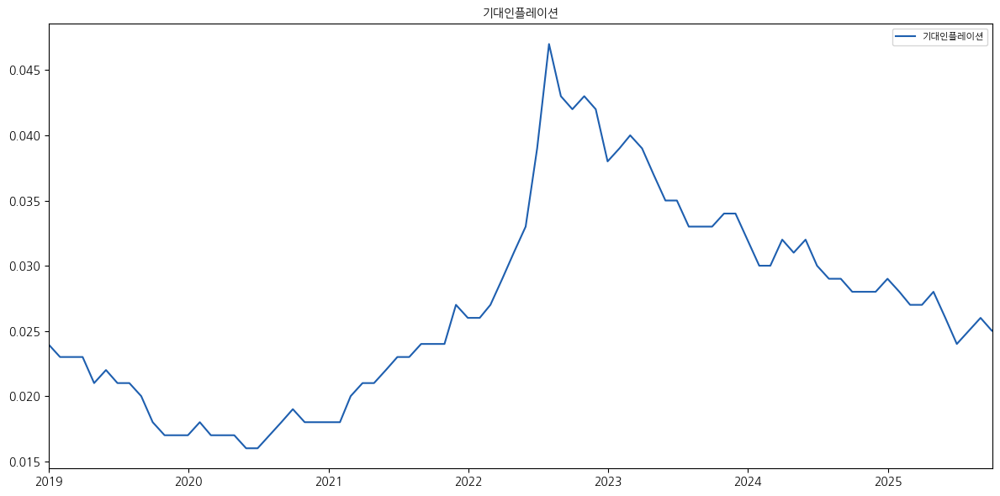

In [318]:
# DCF, DDM 기업가치 계산 최종결과
import math
import matplotlib.dates as mdates
import datetime as dt

reit_names = list(data_skip2['name'].unique())

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2025-10-01")

fig, ax = plt.subplots(figsize=(12, 6))

temp = infl.copy()
temp = temp.sort_values('날짜')
ax.plot(temp['날짜'], temp['기대인플레이션'], label='기대인플레이션', color="#054DA6", alpha=0.9)

ax.set_xlim(start_date, end_date)
ax.set_title('기대인플레이션', fontsize=10)
ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [323]:
temp = data[data['name']=='롯데리츠'][['날짜','FFO_adjusted','div_total','요구수익률_신용프리미엄','기대인플레이션','stocks','DCF_crpr_infl/stocks','DDM_crpr_infl/stocks']].dropna().copy()
temp.rename(columns={'FFO_adjusted':'FFO','div_total':'배당총액','요구수익률_신용프리미엄':'할인율','stocks':'주식수','DCF_crpr_infl/stocks':'DCF','DDM_crpr_infl/stocks':'DDM'},inplace=True)
temp

,날짜,FFO,배당총액,할인율,기대인플레이션,주식수,DCF,DDM
13,2020-06-30,2.777759e+10,2.777759e+10,0.110162,0.016,171968884.0,2783.630304,2783.630262
18,2020-12-31,2.783801e+10,2.783801e+10,0.097496,0.018,171968884.0,4141.410073,4141.410005
28,2021-06-30,3.395721e+10,3.395721e+10,0.065808,0.023,242968884.0,6077.874366,6077.8743
40,2021-12-31,3.880831e+10,3.880831e+10,0.070664,0.026,242968884.0,6879.590086,6879.590098
55,2022-06-30,3.969110e+10,3.969110e+10,0.094074,0.039,242968884.0,6095.177221,6095.177213
72,2022-12-31,3.477734e+10,3.477734e+10,0.115219,0.038,242968884.0,4119.954019,4119.953971
89,2023-06-30,2.652804e+10,2.652803e+10,0.097082,0.035,242968884.0,4206.549575,4206.549516
106,2023-12-31,2.323420e+10,2.323420e+10,0.095381,0.032,242968884.0,3334.781657,3334.781617
123,2024-06-30,2.506825e+10,2.502580e+10,0.074395,0.03,242968884.0,4612.360736,4608.306293
140,2024-12-31,3.021127e+10,3.236452e+10,0.076914,0.029,288968884.0,4108.364993,4265.238405


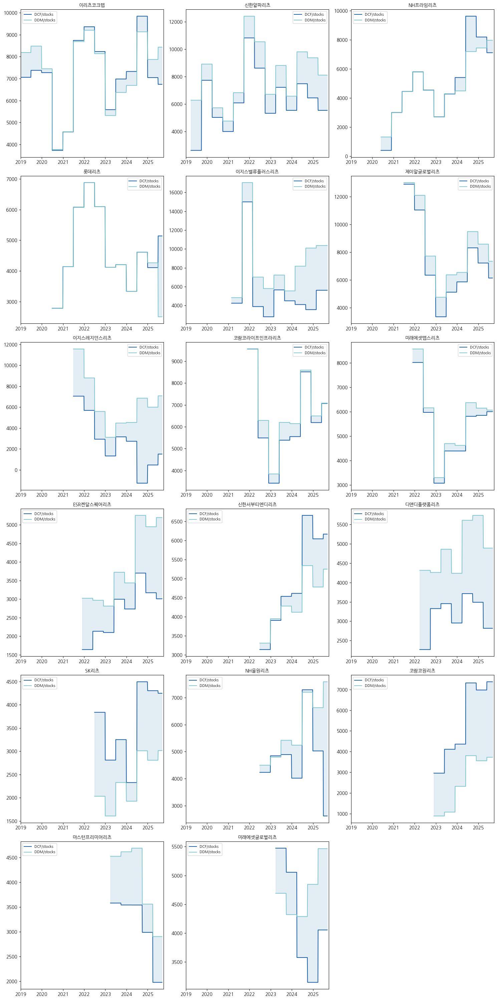

In [412]:
# DCF, DDM 기업가치 계산 최종결과
import math
import matplotlib.dates as mdates
import datetime as dt

reit_names = list(data['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 3
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(15, 30), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2025-10-01")

for i, name in enumerate(reit_names):
    temp = data[data['name']==name].copy()
    temp_price = reits_prices[name]

    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')
    temp = pd.merge(temp, interests[['변환','회사채']], left_on='일자', right_on='변환', how='left')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_crpr_infl/stocks'] = pd.to_numeric(temp['DCF_crpr_infl/stocks'], errors='coerce').ffill()
    temp['DDM_crpr_infl/stocks'] = pd.to_numeric(temp['DDM_crpr_infl/stocks'], errors='coerce').ffill()

    ax = axes[i]
    ax.plot(temp['날짜'], temp['DCF_crpr_infl/stocks'], label='DCF/stocks', color="#054DA6", alpha=0.9)
    ax.plot(temp['날짜'], temp['DDM_crpr_infl/stocks'], label='DDM/stocks', color="#78C3CD", alpha=0.9)
    ax.fill_between(
        temp['날짜'],
        temp['DCF_crpr_infl/stocks'],
        temp['DDM_crpr_infl/stocks'],
        color="#A3C4DC",
        alpha=0.3
    )
    #ax1 = ax.twinx()
    #ax1.plot(temp['날짜'], temp['회사채'], color='black')
    #ax1.axvline(dt.datetime(2022, 11, 1), color='black', linestyle='--', linewidth=1)
    ax.set_xlim(start_date, end_date)
    #ax1.set_xlim(start_date, end_date)
    ax.set_title(name, fontsize=10)
    ax.legend(fontsize=8)


# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [421]:
cr_pr

,날짜_신용프리미엄,국고채,회사채,차이,배율,신용프리미엄
0,2013-10-14,2.880,3.290,0.410,2.247944,0.921657
1,2013-10-15,2.880,3.290,0.410,3.091697,1.267596
2,2013-10-16,2.870,3.280,0.410,3.179920,1.303767
3,2013-10-17,2.850,3.260,0.410,2.975577,1.219987
4,2013-10-18,2.820,3.240,0.420,2.861036,1.201635
...,...,...,...,...,...,...
2969,2025-10-30,2.732,3.135,0.403,3.691773,1.487785
2970,2025-10-31,2.716,3.122,0.406,3.691395,1.498706
2971,2025-11-03,2.741,3.147,0.406,3.691391,1.498705
2972,2025-11-04,2.729,3.136,0.407,3.690947,1.502216


신용프리미엄

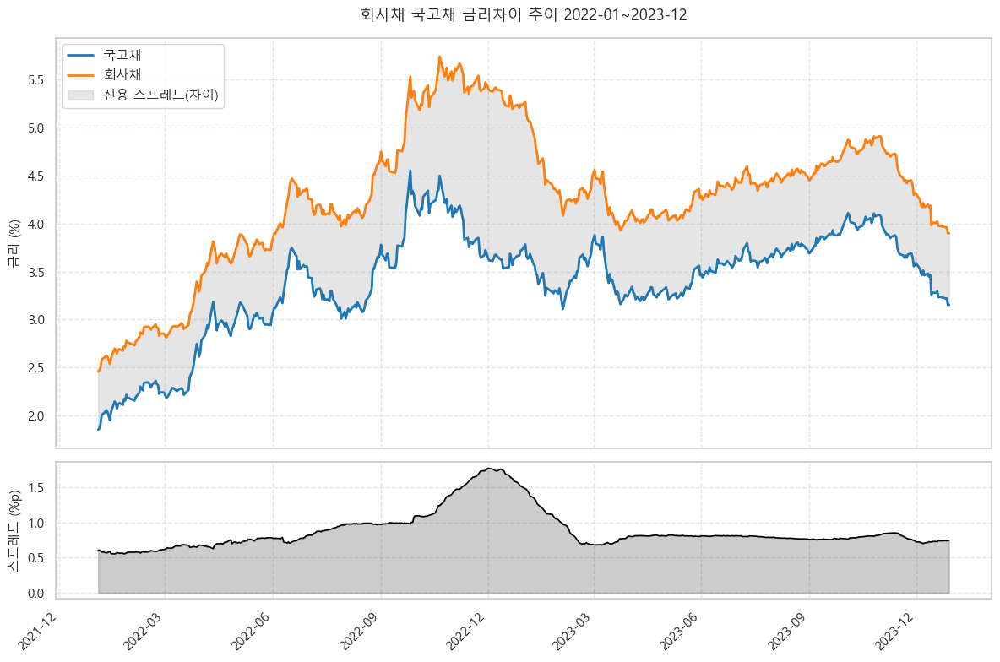

In [468]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# 폰트 설정 (한글 깨짐 방지)
plt.rcParams['font.family'] = 'Malgun Gothic' # 윈도우 기준
plt.rcParams['axes.unicode_minus'] = False    # 마이너스 기호 깨짐 방지

# [기존 데이터 전처리 코드 유지]
start_date = pd.to_datetime("2022-01-01")
end_date = pd.to_datetime("2023-12-31")

temp = cr_pr[(cr_pr['날짜_신용프리미엄'] >= start_date) & 
             (cr_pr['날짜_신용프리미엄'] <= end_date)].copy()
temp = temp.sort_values('날짜_신용프리미엄')

# --- 시각화 수정 시작 ---

# 1. 2행 1열의 서브플롯 생성 (높이 비율 3:1, X축 공유)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, 
                               gridspec_kw={'height_ratios': [3, 1]})

# === [상단 차트] 국고채 vs 회사채 금리 ===
ax1.plot(temp['날짜_신용프리미엄'], temp['국고채'], label='국고채', linewidth=2, color='#1f77b4')
ax1.plot(temp['날짜_신용프리미엄'], temp['회사채'], label='회사채', linewidth=2, color='#ff7f0e')

# 두 선 사이 영역 색칠 (스프레드 시각화)
ax1.fill_between(
    temp['날짜_신용프리미엄'],
    temp['국고채'],
    temp['회사채'],
    where=(temp['회사채'] >= temp['국고채']),
    alpha=0.2,
    interpolate=True,
    color='gray',
    label='신용 스프레드(차이)'
)

ax1.set_ylabel("금리 (%)", fontsize=11)
ax1.set_title(f"회사채 국고채 금리차이 추이 {start_date.strftime('%Y-%m')}~{end_date.strftime('%Y-%m')}", fontsize=13, pad=15)
ax1.legend(loc='upper left')
ax1.grid(True, linestyle='--', alpha=0.5)

# === [하단 차트] 스프레드(차이) 별도 표기 ===
# '차이' 컬럼이 없다면 계산 (있으면 이 줄 생략 가능)
# temp['차이'] = temp['회사채'] - temp['국고채'] 

ax2.plot(temp['날짜_신용프리미엄'], temp['차이'], color='black', linewidth=1.2)

# 하단 차트도 영역을 채워주면 가시성이 높아짐
ax2.fill_between(temp['날짜_신용프리미엄'], 0, temp['차이'], color='black', alpha=0.2)

ax2.set_ylabel("스프레드 (%p)", fontsize=11)
ax2.grid(True, linestyle='--', alpha=0.5)

# === X축 포맷팅 (하단 차트 기준) ===
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) # 3개월 단위 표기 (조절 가능)
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

# === 마무리 ===
plt.tight_layout()
plt.subplots_adjust(hspace=0.05) # 두 차트 사이 간격을 좁게 조절
plt.show()

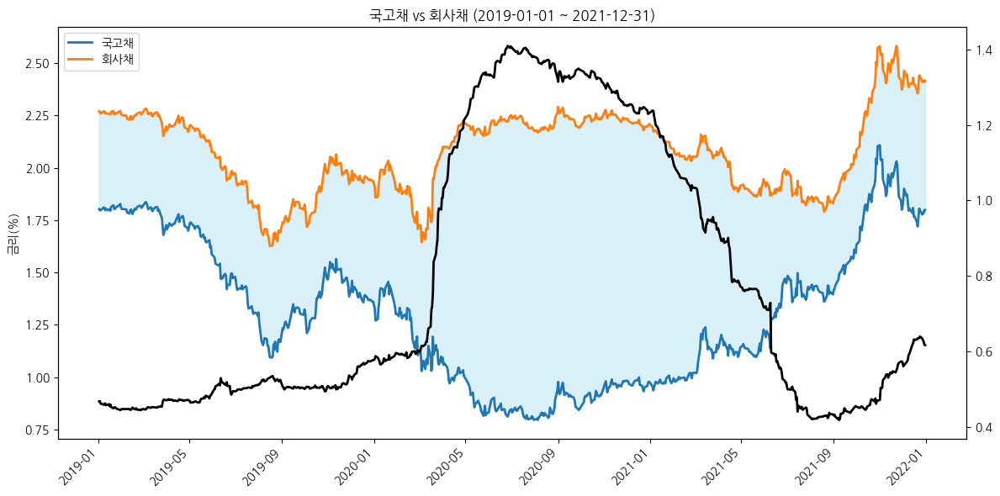

In [ ]:
# 신용프리미엄 관련 회사채-국고채 그래프
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 기간 설정
start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2021-12-31")

# 데이터 필터링
temp = cr_pr[(cr_pr['날짜_신용프리미엄'] >= start_date) &
             (cr_pr['날짜_신용프리미엄'] <= end_date)].copy()

# 날짜 형식
temp = temp.sort_values('날짜_신용프리미엄')

fig, ax = plt.subplots(figsize=(12, 6))

# 선 그래프
ax.plot(temp['날짜_신용프리미엄'], temp['국고채'], label='국고채', linewidth=2)
ax.plot(temp['날짜_신용프리미엄'], temp['회사채'], label='회사채', linewidth=2)

# 두 선 사이 영역 색칠
ax.fill_between(
    temp['날짜_신용프리미엄'],
    temp['국고채'],
    temp['회사채'],
    where=(temp['회사채'] >= temp['국고채']),
    alpha=0.3,
    interpolate=True,
    color='skyblue'
)

ax1 = ax.twinx()
ax1.plot(temp['날짜_신용프리미엄'], temp['차이'], label='회사채', linewidth=2, color='black')

# x축 날짜 포맷 조정
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

# 라벨 및 타이틀
ax.set_title(f"국고채 vs 회사채 ({start_date.strftime('%Y-%m-%d')} ~ {end_date.strftime('%Y-%m-%d')})")
ax.set_ylabel("금리(%)")
ax.legend()

plt.tight_layout()
plt.show()


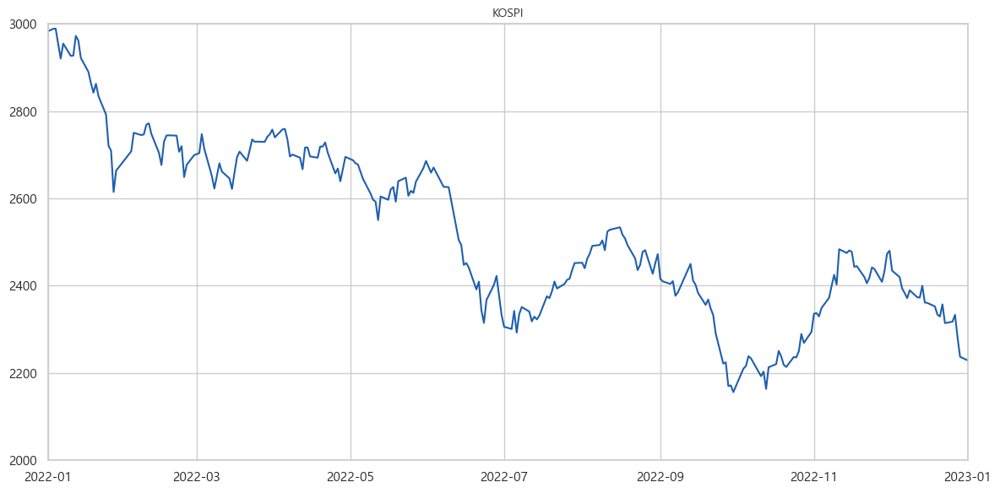

In [476]:
kospi = pd.read_csv('코스피지수.csv', encoding='cp949', header=1)
kospi['일자'] = pd.to_datetime(kospi['일자'])

start_date = pd.to_datetime("2022-01-01")
end_date = pd.to_datetime("2023-01-01")

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(kospi['일자'], kospi['종가지수'], label='코스피', color="#054DA6", alpha=0.9)

ax.set_xlim(start_date, end_date)
ax.set_ylim(2000,3000)
ax.set_title('KOSPI', fontsize=10)
plt.tight_layout()
plt.show()


ㅁㄴㅇㅁㄴㅇ

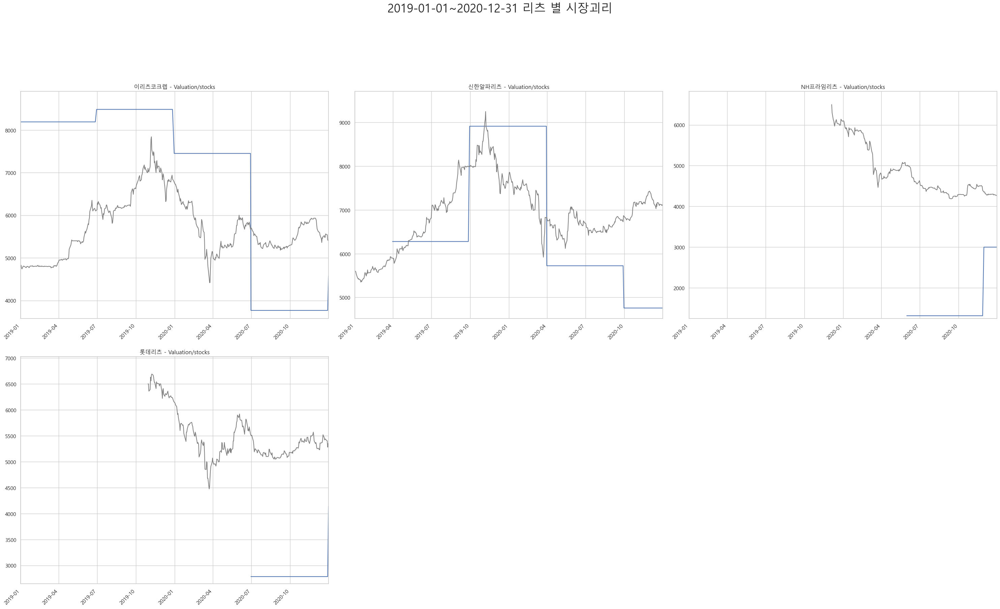

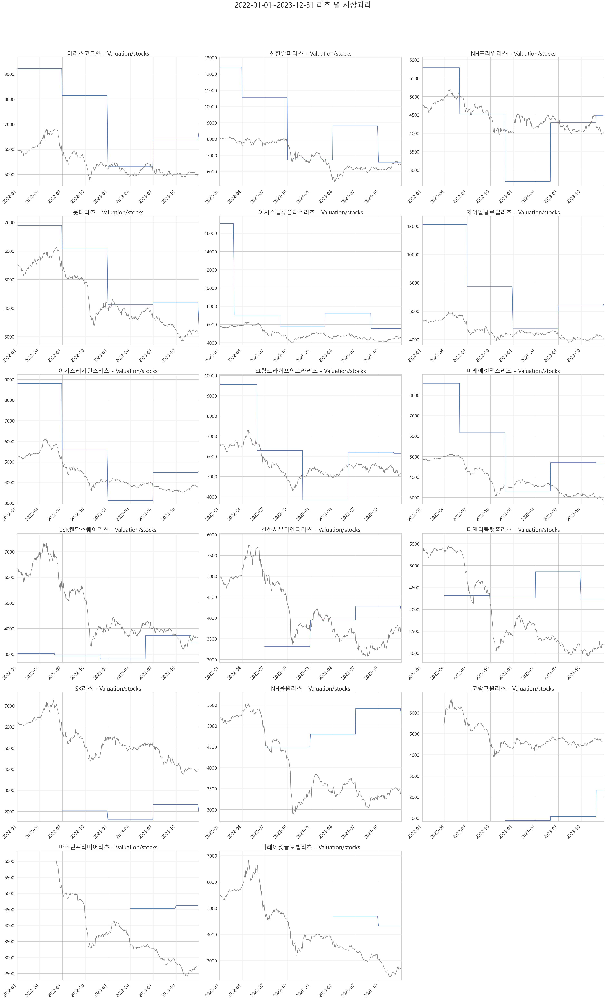

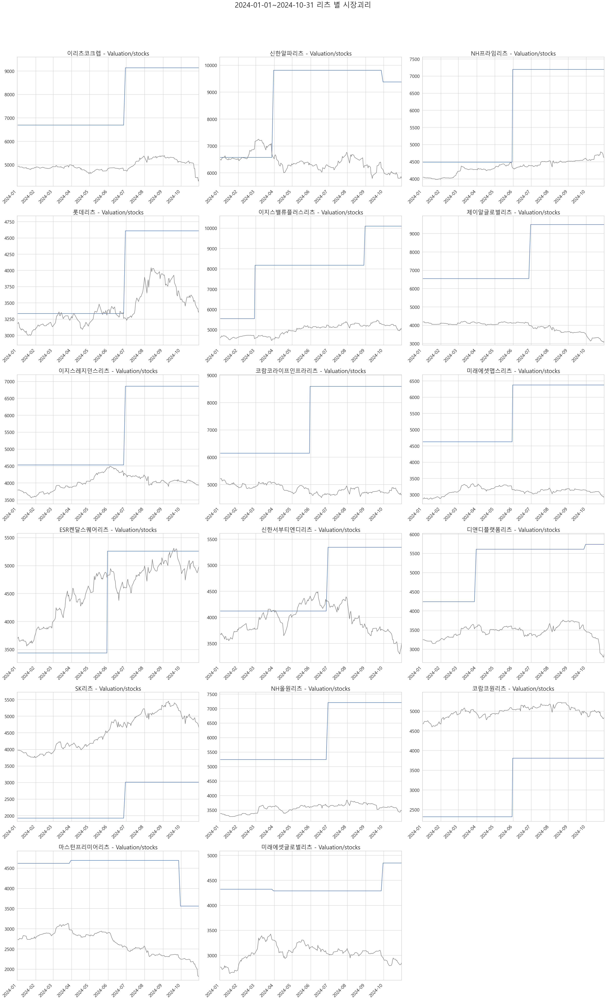

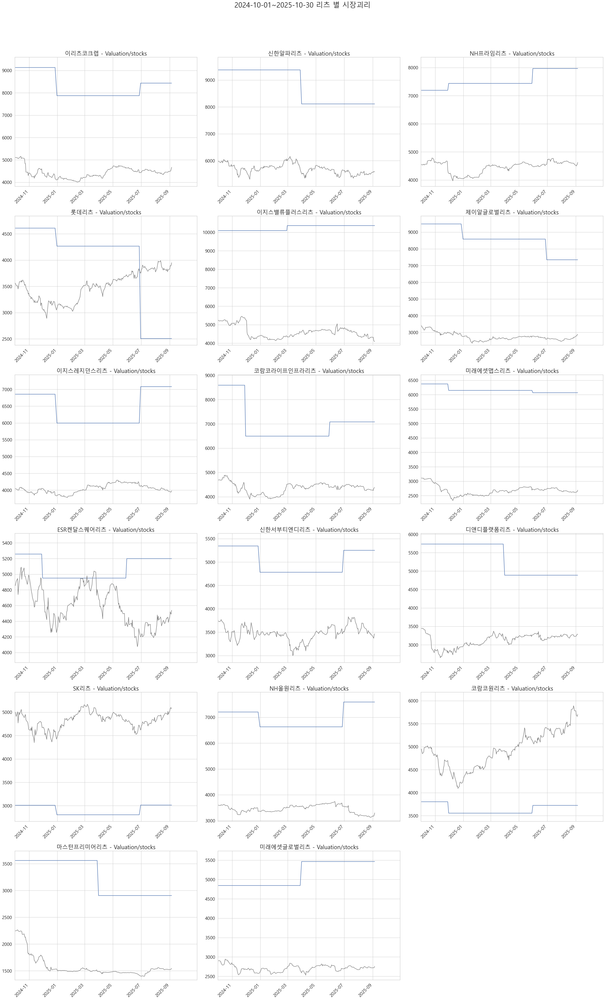

In [485]:
# 주당 기업가치 DCF, DDM (기대 인플레이션 기반) + 신용프리미엄
reit_names = list(data_skip2['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 3
rows = math.ceil(n / cols)  # 17개면 3행 6열

date_list = [(pd.to_datetime("2019-01-01"), pd.to_datetime("2020-12-31")),
             (pd.to_datetime("2022-01-01"), pd.to_datetime("2023-12-31")),
             (pd.to_datetime("2024-01-01"), pd.to_datetime("2024-10-31")),
             (pd.to_datetime("2024-10-01"), pd.to_datetime("2025-10-30"))]

plotted_indices = []
for start_date, end_date in date_list:

    fig, axes = plt.subplots(rows, cols, figsize=(30, 50), sharex=False, sharey=False)
    axes = axes.flatten()  # 2D 배열을 1D로 변환

    for i, name in enumerate(reit_names):
        temp = data[data['name']==name].copy()
        temp_price = reits_prices[name]
        temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

        temp['날짜'] = temp['날짜'].fillna(temp['일자'])
        temp['일자'] = temp['일자'].fillna(temp['날짜'])

        temp = temp.sort_values('일자')
        temp['Close'] = temp['Close'].ffill()
        temp['DCF_crpr_infl/stocks'] = pd.to_numeric(temp['DCF_crpr_infl/stocks'], errors='coerce').ffill()
        temp['DDM_crpr_infl/stocks'] = pd.to_numeric(temp['DDM_crpr_infl/stocks'], errors='coerce').ffill()

        temp = temp[(temp['날짜'] >= start_date) & (temp['날짜'] <= end_date)]
        temp_price = temp_price[(temp_price['일자'] >= start_date) & (temp_price['일자'] <= end_date)]
        
        if temp['DDM_crpr_infl/stocks'].isna().all().all() or temp_price['Close'].isna().all().all():
            continue
        
        ax2 = axes[i]
        plotted_indices.append(i)
        # ------------------ 기대인플레이션 기반 그래프 ------------------    

        # 두 개의 막대를 나란히 배치
        #ax2.plot(temp['날짜'], temp['DCF_crpr_infl/stocks'], label='DCF_crpr_infl/stocks')
        ax2.plot(temp['날짜'], temp['DDM_crpr_infl/stocks'], label='DDM')
        ax2.plot(temp_price['일자'], temp_price['Close'], color='grey', label='주가')

        #ax2.set_ylabel("Value")
        ax2.set_title(f"{name} - Valuation/stocks")
        #ax2.legend()

        # x축 라벨
        #ax2.set_xlabel('Date')

        max_val = max(temp[['DDM_crpr_infl/stocks','Close']].max())
        min_val = min(temp[['DDM_crpr_infl/stocks','Close']].min())

        ax2.set_xlim(start_date, end_date)
        ax2.set_ylim(min_val * 0.95, max_val * 1.05)
        ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

    # 남은 subplot 빈칸 제거
    for k, ax in enumerate(axes):
        if k not in plotted_indices:
            fig.delaxes(ax)
    plotted_indices = []

    plt.rcParams['font.size'] = 18          # 전체 기본 글씨 크기
    plt.rcParams['axes.titlesize'] = 20     # 각 subplot 제목
    plt.rcParams['axes.labelsize'] = 18     # x/y 라벨
    plt.rcParams['xtick.labelsize'] = 16    # x축 tick
    plt.rcParams['ytick.labelsize'] = 16    # y축 tick
    plt.rcParams['legend.fontsize'] = 16    # legend
    
    # 전체 제목
    plt.suptitle(f'{start_date.strftime("%Y-%m-%d")}~{end_date.strftime("%Y-%m-%d")} 리츠 별 시장괴리', fontsize=25)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


{'ESR켄달스퀘어리츠':              일자  Close       marcaps
 0    2020-12-23   5190  7.435142e+11
 1    2020-12-24   5210  7.463794e+11
 2    2020-12-28   5120  7.334861e+11
 3    2020-12-29   5080  7.277557e+11
 4    2020-12-30   5070  7.263231e+11
 ...         ...    ...           ...
 1149 2025-09-01   4460  1.097557e+12
 1150 2025-09-02   4520  1.112322e+12
 1151 2025-09-03   4495  1.106170e+12
 1152 2025-09-04   4490  1.104940e+12
 1153 2025-09-05   4540  1.117244e+12
 
 [1154 rows x 3 columns],
 'KB스타리츠':             일자  Close       marcaps
 0   2022-10-06   4340  4.401380e+11
 1   2022-10-07   4360  4.421663e+11
 2   2022-10-11   4220  4.279683e+11
 3   2022-10-12   4085  4.142774e+11
 4   2022-10-13   3980  4.036289e+11
 ..         ...    ...           ...
 710 2025-09-01   3880  3.934874e+11
 711 2025-09-02   3855  3.909521e+11
 712 2025-09-03   3875  3.929804e+11
 713 2025-09-04   3915  3.970369e+11
 714 2025-09-05   3905  3.960228e+11
 
 [715 rows x 3 columns],
 'NH올원리츠':           

In [451]:
temp_li = []

reits_names = ['이리츠코크렙', '신한알파리츠', 'NH프라임리츠', 
'롯데리츠', '이지스밸류플러스리츠', '제이알글로벌리츠', 
'이지스레지던스리츠', '코람코라이프인프라리츠', '미래에셋맵스리츠']

start_date = pd.to_datetime("2022-01-01")
end_date = pd.to_datetime("2023-12-31")

for name in reits_names:
    temp = reits_prices[name]
    temp = temp[(temp['일자'] >= start_date) & (temp['일자'] <= end_date)]
    temp = temp['Close'].copy()
    temp_li.append(temp)

df = pd.concat(temp_li)
normalized_df = (df / df.iloc[0]) * 100

# 4. 시각화
plt.figure(figsize=(12, 6))

# 데이터 플롯
for col in normalized_df.columns:
    plt.plot(normalized_df.index, normalized_df[col], label=col, linewidth=2)

# 기준선 (100) 추가
plt.axhline(100, color='gray', linestyle='--', linewidth=1, alpha=0.7)

plt.title('주요 종목 주가 변동 비교 (2023.01.01 = 100)', fontsize=15)
plt.ylabel('수익률 지수 (100 기준)', fontsize=12)
plt.xlabel('날짜', fontsize=12)
plt.legend(loc='best', fontsize=11)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

AttributeError: 'Series' object has no attribute 'columns'

<Figure size 1200x600 with 0 Axes>

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\12497445.py:34: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



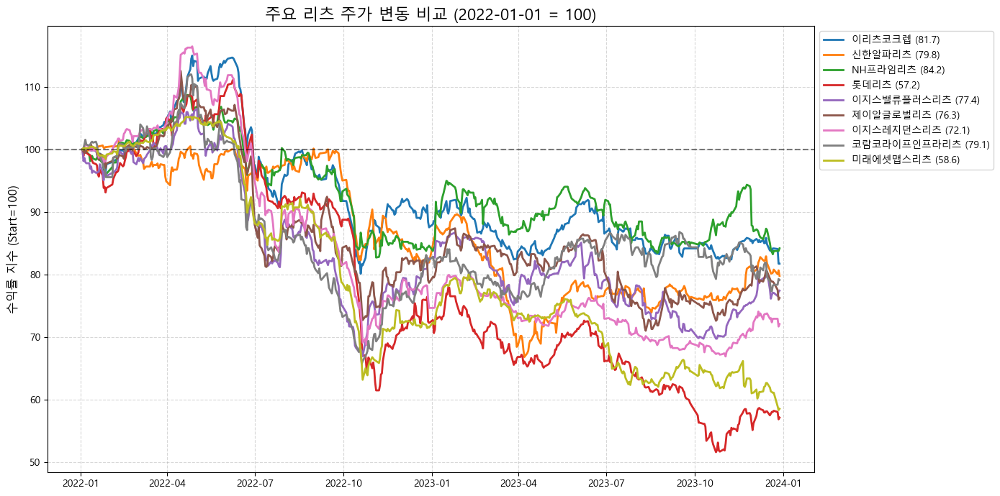

In [452]:
import pandas as pd
import matplotlib.pyplot as plt

# 리스트와 날짜 설정
reits_names = ['이리츠코크렙', '신한알파리츠', 'NH프라임리츠', 
               '롯데리츠', '이지스밸류플러스리츠', '제이알글로벌리츠', 
               '이지스레지던스리츠', '코람코라이프인프라리츠', '미래에셋맵스리츠']

start_date = pd.to_datetime("2022-01-01")
end_date = pd.to_datetime("2023-12-31")

temp_li = []

for name in reits_names:
    # 1. 데이터 가져오기
    temp = reits_prices[name].copy()
    
    # 2. 날짜 변환 및 인덱스 설정 (필수!)
    temp['일자'] = pd.to_datetime(temp['일자'])
    temp = temp.set_index('일자')
    
    # 3. 기간 필터링
    temp = temp.loc[start_date:end_date]
    
    # 4. 종가만 추출하되, 이름을 리츠명으로 변경 (그래프 범례용)
    close_series = temp['Close'].rename(name)
    
    temp_li.append(close_series)

# 5. 데이터프레임 합치기 (axis=1 : 옆으로 붙이기)
df = pd.concat(temp_li, axis=1)

# *중요*: 중간에 비어있는 데이터(NaN)가 있으면 끊겨 보이므로 앞의 값으로 채움
df = df.fillna(method='ffill').fillna(method='bfill')

# 6. 지수화 (첫 날짜 기준 100)
normalized_df = (df / df.iloc[0]) * 100

# 7. 시각화
plt.figure(figsize=(14, 7))

for col in normalized_df.columns:
    # 마지막 값(최종 수익률)을 라벨에 표시하면 보기 좋음
    final_val = normalized_df[col].iloc[-1]
    label_text = f"{col} ({final_val:.1f})"
    plt.plot(normalized_df.index, normalized_df[col], label=label_text, linewidth=2)

# 기준선
plt.axhline(100, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

# 꾸미기
plt.title(f'주요 리츠 주가 변동 비교 ({start_date.date()} = 100)', fontsize=16)
plt.ylabel('수익률 지수 (Start=100)', fontsize=12)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1)) # 범례를 그래프 밖으로
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()

In [454]:
import plotly.graph_objects as go
import plotly.express as px

# Plotly 전용 색상 팔레트
colors = px.colors.qualitative.Plotly

fig = go.Figure()

for i, col in enumerate(normalized_df.columns):
    fig.add_trace(go.Scatter(
        x=normalized_df.index, 
        y=normalized_df[col], 
        mode='lines', 
        name=col,
        line=dict(width=2, color=colors[i % len(colors)]),
        hovertemplate='%{y:.1f}' # 호버 시 소수점 1자리까지 표시
    ))

# 기준선 추가
fig.add_hline(y=100, line_dash="dash", line_color="gray", opacity=0.7)

# 레이아웃 설정
fig.update_layout(
    title={
        'text': '주요 리츠 주가 변동 비교 (2022.01.01 = 100)',
        'y':0.95, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top',
        'font': dict(size=24, family='Malgun Gothic', color='black')
    },
    xaxis_title='날짜',
    yaxis_title='수익률 지수 (100 기준)',
    template='plotly_white', # 깔끔한 흰색 배경
    hovermode='x unified', # [핵심] 마우스 위치의 모든 종목 값 표시
    legend=dict(title='종목명', font=dict(size=14)),
    height=700
)

fig.show()

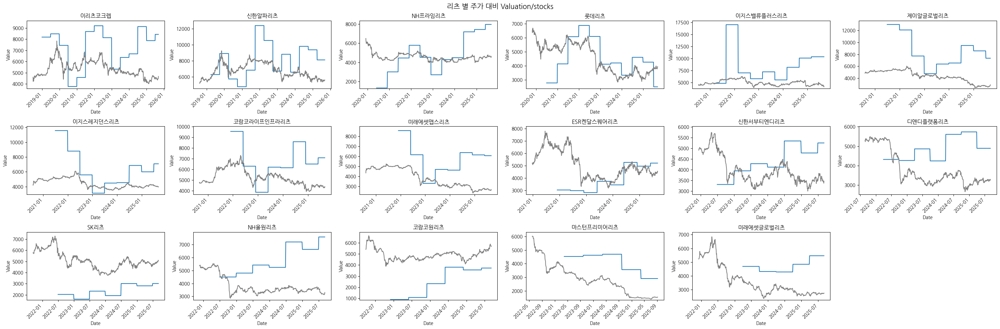

In [365]:
# 주당 기업가치 DCF, DDM (기대 인플레이션 기반) + 신용프리미엄
reit_names = list(data_skip2['name'].unique())
n = len(reit_names)

# subplot 크기 설정
cols = 6
rows = math.ceil(n / cols)  # 17개면 3행 6열

fig, axes = plt.subplots(rows, cols, figsize=(30, 10), sharex=False, sharey=False)
axes = axes.flatten()  # 2D 배열을 1D로 변환

for i, name in enumerate(reit_names):
    temp = data[data['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp = temp.sort_values('일자')
    temp['Close'] = temp['Close'].ffill()
    temp['DCF_crpr_infl/stocks'] = pd.to_numeric(temp['DCF_crpr_infl/stocks'], errors='coerce').ffill()
    temp['DDM_crpr_infl/stocks'] = pd.to_numeric(temp['DDM_crpr_infl/stocks'], errors='coerce').ffill()

    ax2 = axes[i]
    # ------------------ 기대인플레이션 기반 그래프 ------------------    

    # 두 개의 막대를 나란히 배치
    #ax2.plot(temp['날짜'], temp['DCF_crpr_infl/stocks'], label='DCF_crpr_infl/stocks')
    ax2.plot(temp['날짜'], temp['DDM_crpr_infl/stocks'], label='DDM')
    ax2.plot(temp_price['일자'], temp_price['Close'], color='grey', label='주가')

    ax2.set_ylabel("Value")
    ax2.set_title(f"{name}")

    # x축 라벨
    ax2.set_xlabel('Date')

    '''max_val = max(temp[['DCF_crpr_infl/stocks','DDM_crpr_infl/stocks','Close']].max())
    min_val = min(temp[['DCF_crpr_infl/stocks','DDM_crpr_infl/stocks','Close']].min())'''

    max_val = max(temp[['DDM_crpr_infl/stocks','Close']].max())
    min_val = min(temp[['DDM_crpr_infl/stocks','Close']].min())
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

# 남은 subplot 빈칸 제거
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# 전체 제목
plt.suptitle(f'리츠 별 주가 대비 Valuation/stocks', fontsize=15)
plt.tight_layout()
plt.show()

In [498]:
data = {"변경일자": ["2025-05-29","2025-02-25","2024-11-28","2024-10-11","2023-01-13","2022-11-24",
        "2022-10-12","2022-08-25","2022-07-13","2022-05-26","2022-04-14","2022-01-14","2021-11-25"],
    "기준금리": [2.50,2.75,3.00,3.25,3.50,3.25,3.00, 2.50, 2.25,1.75,1.50,1.25,1.00]}

df_rate = pd.DataFrame(data)
df_rate["변경일자"] = pd.to_datetime(df_rate["변경일자"])

interests = pd.read_csv('시장금리(일별).csv')
interests.rename(columns={'회사채(3년, AA-)':'회사채'}, inplace=True)
interests['변환'] = pd.to_datetime(interests['변환'])
interests

df_rate

,변경일자,기준금리
0,2025-05-29,2.50
1,2025-02-25,2.75
2,2024-11-28,3.00
3,2024-10-11,3.25
4,2023-01-13,3.50
5,2022-11-24,3.25
6,2022-10-12,3.00
7,2022-08-25,2.50
8,2022-07-13,2.25
9,2022-05-26,1.75


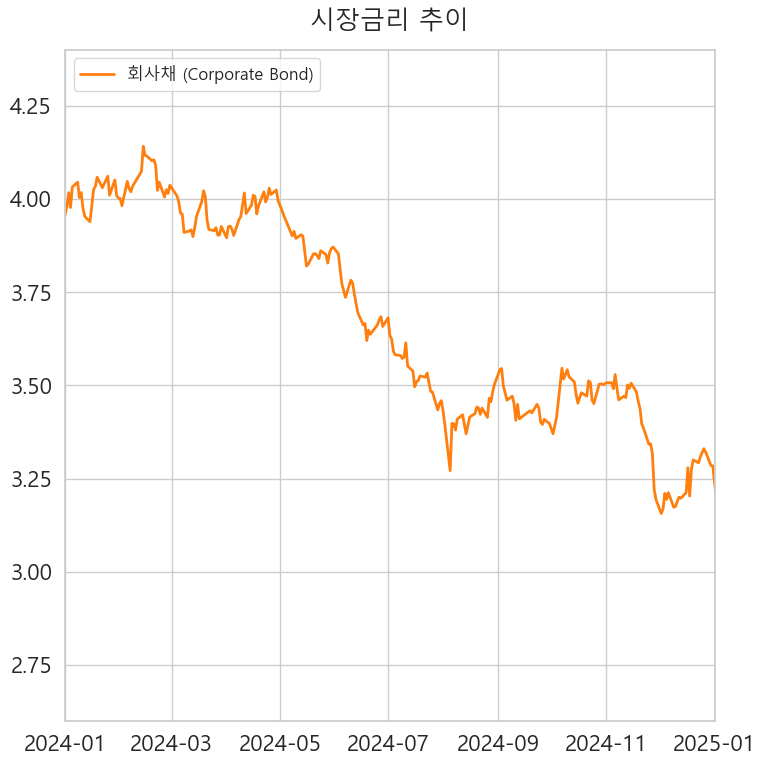

In [524]:
# 1. 날짜 형식 변환
df_rate['변경일자'] = pd.to_datetime(df_rate['변경일자'])
interests['변환'] = pd.to_datetime(interests['변환'])

# 2. 기준금리 정렬 (과거 -> 미래 순서여야 ffill이 먹힘)
df_rate = df_rate.sort_values('변경일자')
interests = interests.sort_values('변환')

# 3. 데이터 병합 (interests를 기준으로 df_rate를 합침)
# '변환' 컬럼을 기준으로 합치되, 기준금리가 없는 날은 NaN이 됨
merged_df = pd.merge(interests, df_rate, left_on='변환', right_on='변경일자', how='left')

# 4. 기준금리 채우기 (Forward Fill)
# 오늘 기준금리가 없으면 어제 금리를 가져옴 (계단식 데이터 완성)
merged_df['기준금리'] = merged_df['기준금리'].ffill()

# 5. 시각화 기간 설정 (데이터가 있는 구간만)
# 기준금리 데이터가 시작되는 시점부터 보고 싶다면 아래 필터링 사용
start_date = df_rate['변경일자'].min()
plot_data = merged_df[merged_df['변환'] >= start_date].copy()


# --- [시각화] ---

fig, ax = plt.subplots(figsize=(8, 8))

x = plot_data['변환']
y_corp = plot_data['회사채']
y_base = plot_data['기준금리']

# 1. 회사채 (꺾은선 그래프)
ax.plot(x, y_corp, label='회사채 (Corporate Bond)', color='#ff7f0e', linewidth=2)

# 2. 기준금리 (계단식 그래프 - step)
# ffill을 했지만, 시각적으로 명확히 하기 위해 step 함수 사용 가능 (혹은 그냥 plot도 무방)
#ax.step(x, y_base, label='한국은행 기준금리', color='black', linewidth=2, where='post', linestyle='-')

# 디자인 디테일
ax.legend(fontsize=12, loc='upper left')
ax.set_xlim(pd.to_datetime("2024-01-01"), pd.to_datetime("2025-01-01"))
ax.set_ylim(2.6, 4.4)
# 날짜 포맷
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=0)
plt.title('시장금리 추이', fontsize=18, pad=15)
plt.tight_layout()
plt.show()

C:\Users\minju\AppData\Local\Temp\ipykernel_33760\2575527362.py:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



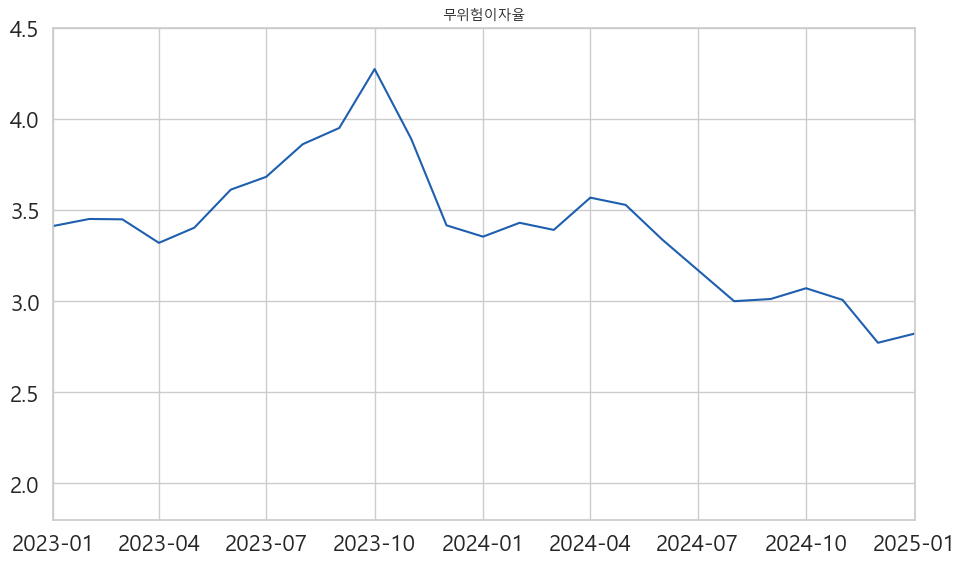

In [496]:
rf_data = pd.read_csv('국고채10년.csv')
rf_data = rf_data.T
rf_data = rf_data.iloc[4:]
rf_data.index = pd.to_datetime(rf_data.index)

start_date = pd.to_datetime("2023-01-01")
end_date = pd.to_datetime("2025-01-01")

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(rf_data.index, rf_data[0], label='무위험이자율', color="#054DA6", alpha=0.9)

ax.set_xlim(start_date, end_date)
ax.set_ylim(1.8, 4.5)
ax.set_title('무위험이자율', fontsize=10)
plt.tight_layout()
plt.show()

P/FFO

In [ ]:
name = '이지스레지던스리츠'
temp = data_skip2[data_skip2['name']==name].copy()
temp_price = reits_prices[name]
temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

temp['날짜'] = temp['날짜'].fillna(temp['일자'])
temp['일자'] = temp['일자'].fillna(temp['날짜'])

temp = temp.sort_values('일자')
temp['Close'] = temp['Close'].ffill()
temp['DCF/stocks'] = temp['DCF/stocks'].ffill()
temp['DDM/stocks'] = temp['DDM/stocks'].ffill()
temp['DCF_infl/stocks'] = pd.to_numeric(temp['DCF_infl/stocks'], errors='coerce').ffill()
temp['DDM_infl/stocks'] = pd.to_numeric(temp['DDM_infl/stocks'], errors='coerce').ffill()

temp['FFO_adjusted'] = pd.to_numeric(temp['FFO_adjusted'], errors='coerce').ffill()
temp['stocks'] = pd.to_numeric(temp['stocks'], errors='coerce').ffill()
temp['P/FFO_adjusted'] = temp['marcaps'] /temp['FFO_adjusted']
plt.plot(temp['날짜'], temp['P/FFO_adjusted'], marker='o', color='purple', label='P/FFO_adjusted')

In [ ]:
pffos = []
reit_names = list(data_skip2['name'].unique())
for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])
    temp = temp.sort_values('일자')
    
    temp['FFO_adjusted'] = pd.to_numeric(temp['FFO_adjusted'], errors='coerce').ffill()
    temp['P/FFO_adjusted'] = temp['marcaps'] /temp['FFO_adjusted']
    temp['name'] = temp['name'].fillna(name)
    temp = temp[['날짜','name','P/FFO_adjusted']]
    temp = temp[temp['P/FFO_adjusted'].notna()]
    pffos.append(temp)

df_pffos = pd.concat(pffos)
df_pffos = df_pffos[df_pffos['name']!='이지스레지던스리츠']
df_pffos = df_pffos[df_pffos['name']!='이지스밸류플러스리츠']
df_daily_mean = df_pffos.groupby('날짜', as_index=False)['P/FFO_adjusted'].mean()
df_daily_mean

In [ ]:
df_pffos[df_pffos['name']=='이지스밸류플러스리츠']['P/FFO_adjusted'].plot()

In [ ]:
df_daily_mean[(df_daily_mean['날짜']>='20191101')&(df_daily_mean['날짜']<='20200101')]

In [ ]:
import plotly.express as px
import plotly.io as pio

# 렌더러를 'notebook'으로 설정 (주피터 노트북 전용)
pio.renderers.default = "notebook" 

# 혹은 'iframe'으로 설정 (가장 안전한 방법, 호환성이 좋음)
# pio.renderers.default = "iframe"

fig = px.line(df_daily_mean, x='날짜', y='P/FFO_adjusted', title='P/FFO 추이')
fig.update_xaxes(
    dtick="M1",             # (선택) 눈금을 '1개월' 단위로 고정 (너무 촘촘하면 M3, M6 등으로 변경)
    tickformat="%Y-%m-%d",  # 축 아래에 보이는 글자 형식 (예: 2024-01-01)
    hoverformat="%Y-%m-%d"  # ★ 마우스 올렸을 때 보이는 날짜 형식
)
fig.show()

In [ ]:
plt.plot(df_daily_mean['날짜'], df_daily_mean['P/FFO_adjusted'])

In [ ]:
asset = pd.read_csv('리츠_투자자산_v1.0.csv')

In [ ]:
plt.figure(figsize=(11,6))

for name, temp in df_pffos.groupby('name'):
    if temp['P/FFO_adjusted'].std() < 10:
        continue
    if name == '이지스레지던스리츠':
        continue
    plt.plot(temp['날짜'], temp['P/FFO_adjusted'], label=name)

plt.xlabel('날짜')
plt.ylabel('P/FFO_adjusted')
plt.legend()
plt.title('Name 별 P/FFO_adjusted 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(11,6))

for name, temp in df_pffos.groupby('name'):
    if temp['P/FFO_adjusted'].std() >= 10:
        continue
    if name == '이지스레지던스리츠':
        continue
    plt.plot(temp['날짜'], temp['P/FFO_adjusted'], label=name)

plt.xlabel('날짜')
plt.ylabel('P/FFO_adjusted')
plt.legend()
plt.title('Name 별 P/FFO_adjusted 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
low_std_li = []
for name, temp in df_pffos.groupby('name'):
    if temp['P/FFO_adjusted'].std() < 10:
        low_std_li.append(name)
low_std_li

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 데이터 피벗 (행: 날짜, 열: 종목명, 값: P/FFO)
# 결측치(NaN)가 있으면 클러스터링이 안 되므로, 데이터가 충분한 최근 기간으로 자르거나 채워야 합니다.
df_pffos = df_pffos[df_pffos['name'].isin(low_std_li)]
df_pivot = df_pffos.pivot(index='날짜', columns='name', values='P/FFO_adjusted')

# (혹시 날짜가 문자열이라면 날짜 형식으로 변환 - 필수 과정은 아니지만 안전함)
df_pivot.index = pd.to_datetime(df_pivot.index)

# 2. 2023년 1월 1일 이후 데이터만 잘라내기
df_pivot_2023 = df_pivot.loc['2023-01-01':]

# 2. 상관관계 행렬 계산 (움직임의 유사도)
corr_matrix = df_pivot_2023.corr()

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# 1. 클러스터링 모델 생성 (n_clusters=4 처럼 원하는 그룹 개수를 지정하세요)
# affinity='euclidean', linkage='ward'는 clustermap 기본값과 동일
n_clusters = 5  # 히트맵 보고 적절하다 싶은 개수로 변경 가능
cluster_model = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')

# 2. 그룹 번호표(Label) 생성
# corr_matrix를 넣으면 '상관관계 패턴이 비슷한' 종목끼리 묶입니다.
cluster_labels = cluster_model.fit_predict(corr_matrix)

# 3. '종목명' : '그룹번호' 딕셔너리 만들기
name_to_cluster = dict(zip(corr_matrix.index, cluster_labels))

# 4. 원본 데이터프레임(df)에 'Cluster' 컬럼 추가
# map 함수를 쓰면 종목명에 맞는 그룹번호가 자동으로 붙습니다.
df_pffos['cluster'] = df_pffos['name'].map(name_to_cluster)

In [ ]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

scores = []
k_range = range(2, 10) # 2개부터 9개까지 시도

for k in k_range:
    # 모델 생성 및 학습
    model = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
    labels = model.fit_predict(corr_matrix)
    
    # 실루엣 점수 계산
    score = silhouette_score(corr_matrix, labels)
    scores.append(score)

# 그래프 그리기
plt.figure(figsize=(10, 5))
plt.plot(k_range, scores, marker='o', linestyle='--')
plt.title('클러스터 개수(k)에 따른 실루엣 점수')
plt.xlabel('클러스터 개수 (k)')
plt.ylabel('실루엣 점수 (높을수록 좋음)')
plt.grid()
plt.show()

# 가장 높은 점수의 k 출력
best_k = k_range[scores.index(max(scores))]
print(f"추천하는 최적의 클러스터 개수: {best_k}개")

In [ ]:
for cluster in range(5):
    plt.figure(figsize=(11,6))
    for name, temp in df_pffos.groupby('name'):
        if temp['cluster'].values[0] != cluster:
            continue
        plt.plot(temp['날짜'], temp['P/FFO_adjusted'], label=name)
    plt.xlabel('날짜')
    plt.ylabel('P/FFO_adjusted')
    plt.legend()
    plt.title('Name 별 P/FFO_adjusted 추이')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
colors = {
    0: 'blue',
    1: 'orange',
    2: 'red',
    3: 'green',
    4: 'purple',
    5: 'brown',
    6: 'pink',
    7: 'gray',
    8: 'cyan'
}
plt.figure(figsize=(11,6))
for name, temp in df_pffos.groupby('name'):
    cluster_num = temp['cluster'].values[0]
    #cluster_num = results[results['Name']==name]['Cluster'].values[0]
    plt.plot(temp['날짜'], temp['P/FFO_adjusted'], label=name, color=colors[cluster_num])

plt.xlabel('날짜')
plt.ylabel('P/FFO_adjusted')
plt.legend()
plt.title('Name 별 P/FFO_adjusted 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

'''plt.figure(figsize=(11,6))
for name, temp in df_pffos.groupby('name'):
    #cluster_num = temp['cluster'].values[0]
    cluster_num = results[results['Name']==name]['Cluster'].values[0]
    plt.plot(temp['날짜'], temp['P/FFO_adjusted'], label=name, color=colors[cluster_num])

plt.xlabel('날짜')
plt.ylabel('P/FFO_adjusted')
plt.legend()
plt.title('Name 별 P/FFO_adjusted 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()'''

In [ ]:
simple_table = df_pffos[['name', 'cluster']].drop_duplicates().sort_values('name')
simple_table.sort_values(by='cluster')

In [ ]:
results.sort_values(by='Cluster')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler

# 1. 데이터 준비 (앞선 pivot 데이터 사용)
# DTW는 결측치(NaN)를 허용하지 않으므로 보간법으로 채웁니다.
df_pivot = df_pffos.pivot(index='날짜', columns='name', values='P/FFO_adjusted')


# (혹시 날짜가 문자열이라면 날짜 형식으로 변환 - 필수 과정은 아니지만 안전함)
df_pivot.index = pd.to_datetime(df_pivot.index)
# 2. 2023년 1월 1일 이후 데이터만 잘라내기
df_pivot_2023 = df_pivot.loc['2023-01-01':]

df_clean = df_pivot_2023.interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')

# 데이터 구조 변환: (종목 수, 시간 길이, 1) 형태의 3차원 배열이 필요함
X = df_clean.values
X = X.reshape((X.shape[1], X.shape[0], 1)) # (Name, Date, 1)

# 2. 데이터 스케일링 (중요!)
# P/FFO 절대값이 20인 것과 50인 것을 같은 패턴으로 인식하게 하려면 정규화가 필수입니다.
# 각 종목별로 평균 0, 분산 1로 맞춥니다.
scaler = TimeSeriesScalerMeanVariance()
X_scaled = scaler.fit_transform(X)

# 3. DTW K-Means 모델링
# metric="dtw"가 핵심입니다.
print("DTW 클러스터링 진행 중... (데이터가 많으면 시간이 좀 걸립니다)")
n_clusters = 4
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", max_iter=10, random_state=42)
y_pred = model.fit_predict(X_scaled)

# 4. 결과 정리
results = pd.DataFrame({'Name': df_clean.columns, 'Cluster': y_pred})
print(results.sort_values('Cluster'))

In [ ]:
plt.figure(figsize=(12, 8))

for cluster_id in range(n_clusters):
    plt.subplot(2, 2, cluster_id + 1) # 2x2 격자로 그리기 (cluster 개수에 맞춰 조정 필요)
    
    # 1. 해당 클러스터에 속한 실제 종목들의 흐름 (회색, 흐릿하게)
    for series in X_scaled[y_pred == cluster_id]:
        plt.plot(series.ravel(), "k-", alpha=.2)
    
    # 2. 해당 클러스터의 대표 패턴 (빨간색, 굵게)
    plt.plot(model.cluster_centers_[cluster_id].ravel(), "r-", linewidth=2)
    
    # 제목에 포함된 종목들 나열 (너무 길면 잘라서)
    members = results[results['Cluster'] == cluster_id]['Name'].tolist()
    title_str = f"Cluster {cluster_id}: {', '.join(members[:3])}" 
    if len(members) > 3: title_str += "..."
    
    plt.title(title_str)
    plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
# P/FFO 시각화
reit_names = list(data_skip2['name'].unique())

for name in reit_names:
    temp = data_skip2[data_skip2['name']==name].copy()
    temp_price = reits_prices[name]
    temp = pd.merge(temp, temp_price, left_on='기준일자', right_on='일자', how='right')

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])
    temp = temp.sort_values('일자')

    temp['FFO_adjusted'] = pd.to_numeric(temp['FFO_adjusted'], errors='coerce').ffill()
    temp['P/FFO_adjusted'] = temp['marcaps'] /temp['FFO_adjusted']

    # --------------------------------------------------------------------------------------------

    fig, ax1 = plt.subplots(figsize=(12,6))

    ax1.plot(temp['날짜'], temp['P/FFO_adjusted'], color='purple', label='P/FFO_adjusted')
    ax1.set_ylabel('P/FFO_adjusted', color='purple')
    ax1.tick_params(axis='y', labelcolor='purple')
    #ax1.axhline(30, color='black')
    # 오른쪽 y축 그래프
    ax2 = ax1.twinx()
    #ax2.plot(temp['일자'], temp['Close'], color='red', label='Close')
    #ax2.plot(temp['날짜'], temp['DCF_infl/stocks'], color='blue', label='DCF_infl/stocks')
    #ax2.plot(temp['날짜'], temp['DDM_infl/stocks'], color='orange', label='DDM_infl/stocks')
    ax2.set_ylabel('Value', color='black')
    ax2.tick_params(axis='y', labelcolor='black')
    
    # x축 라벨
    ax1.set_xlabel('Date')

    # 범례 처리
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    plt.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    # y축 범위 지정
    min_val = min(temp[['Close']].min())
    max_val = max(temp[['Close']].max())

    ax1.set_ylim(20, 60)
    ax2.set_ylim(min_val * 0.95, max_val * 1.05)  # 5% 여유
    
    # 전체 제목
    plt.suptitle(f'{name} — Close with P/FFO', fontsize=15)
    plt.tight_layout()
    plt.show()

In [ ]:
# 모든 리츠에 대한 일단 시각화
for name in rets:
    if name in reits_prices.keys():
        reit_price = reits_prices[name]
    else:
        continue
    temp = merged2[merged2['리츠명'] == name].sort_values(['날짜'])
    
    fig, ax1 = plt.subplots(figsize=(12,6))

    # 왼쪽 y축 그래프
    ax1.plot(temp['날짜'], temp['value'], marker='o', color='blue', label=name)
    ax1.set_ylabel(name, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # 오른쪽 y축 그래프
    ax2 = ax1.twinx()
    ax2.plot(reit_price['일자'], reit_price['Close'], color='red', label=reit_name)
    ax2.set_ylabel(reit_name, color='red')
    ax2.tick_params(axis='y', labelcolor='red')

    # x축 라벨
    ax1.set_xlabel('Date')

    # 범례 처리
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    plt.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.title(f'{name}')
    plt.show()


In [ ]:
def make_temp(data, reit_price, shares):
    # temp: 개별 리츠의 (배당총액, FFO, 배당성장률, 기대수익률, 주당배당금)  + 주당배당금, 총유통주식수
    temp = data[data['리츠명'] == name].sort_values(['날짜']).copy()
    #temp['주당배당금'] = [None,127,119,125,123,110,None,131,400,140,518,126]
    temp['shares'] = shares
    temp['value/shares'] = round((temp['value']/temp['shares']).fillna(0),3)
    temp['DDM/shares'] = round((temp['DDM']/temp['shares']).fillna(0), 3)
    temp['diff'] = temp['DDM/shares'] - temp['value/shares']
    temp[['날짜','FFO','dividend','value/shares','DDM/shares','diff']]

    temp = pd.merge(
        temp[['날짜','value','dps', '요구수익률','dividend', 'dividend_growth', 'FFO', 'value/shares','DDM/shares']],
        reit_price[['일자','Close']],
        left_on='날짜', 
        right_on='일자',
        how='outer'
    )
    temp['Close'] = temp['Close'].ffill()
    temp['market_cap'] = temp['Close'] * shares

    temp['날짜'] = temp['날짜'].fillna(temp['일자'])
    temp['일자'] = temp['일자'].fillna(temp['날짜'])

    temp['P/FFO'] = temp['Close']*shares /temp['value']
    temp['P/D'] = temp['Close'] / temp['dps']
    temp['D/P'] = temp['dps'] / temp['Close']

    temp['Eg'] = temp['요구수익률'] - temp['D/P']
    temp['Eg2'] = (temp['market_cap']*temp['요구수익률'] - temp['FFO']) / (temp['market_cap'] + temp['FFO']) #(주가*shares*r - FFO) / (주가*shares+FFO)

    temp['value(Eg)'] = temp['FFO']*(1+temp['Eg']) / (temp['요구수익률'] - temp['Eg'])
    temp['value(Eg)/shares'] = temp['value(Eg)'] / shares

    temp['value(Eg2)'] = temp['FFO']*(1+temp['Eg2']) / (temp['요구수익률'] - temp['Eg2'])
    temp['value(Eg2)/shares'] = temp['value(Eg2)'] / shares

    temp['diff_value(Eg, g)'] = temp['value(Eg)'] -  temp['value']

    temp['diff(g, Eg)'] = temp['dividend_growth'] - temp['Eg']
    temp['diff(Eg, Eg2)'] = temp['Eg'] - temp['Eg2']
    temp['diff(g, Eg2)'] = temp['dividend_growth'] - temp['Eg2']

    temp['Eg3'] = (temp['market_cap']*temp['요구수익률'] - temp['dividend']) / (temp['market_cap'] + temp['dividend']) #(주가*shares*r - FFO) / (주가*shares+FFO)

    temp['value(Eg3)'] = temp['dividend']*(1+temp['Eg3']) / (temp['요구수익률'] - temp['Eg3'])
    temp['value(Eg3)/shares'] = temp['value(Eg3)'] / shares

    temp['diff(g, Eg3)'] = temp['dividend_growth'] - temp['Eg3']
    temp['diff(Eg2, Eg3)'] = temp['Eg2'] - temp['Eg3']

    return temp


In [ ]:
rets = list(data['리츠명'].unique())

temps = {}
share_dict = {'NH프라임리츠':18660000}

for name in rets:
    reit_price = reits_prices[name]
    shares = share_dict[name]
    temp = make_temp(data, reit_price, shares)
    temps[name] = temp

In [ ]:
n_values = range(1, 120)  # 예: 1~12개월 이동

results = cal_diff(temp, reit_price, n_values, op='-', graph_style='horizontal')
sorted_items = sorted(results.items(), key=lambda x: x[1])
top_10 = sorted_items[:10]
for k, v in top_10:
    print(f"n={k}, total_area={v}")

print('')
results = cal_diff(temp, reit_price, n_values, op='-', graph_style='linear')
sorted_items = sorted(results.items(), key=lambda x: x[1])
top_10 = sorted_items[:10]
for k, v in top_10:
    print(f"n={k}, total_area={v}")

print('')
results = cal_diff(temp, reit_price, n_values, op='+', graph_style='horizontal')
sorted_items = sorted(results.items(), key=lambda x: x[1])
top_10 = sorted_items[:10]
for k, v in top_10:
    print(f"n={k}, total_area={v}")

print('')
results = cal_diff(temp, reit_price, n_values, op='+', graph_style='linear')
sorted_items = sorted(results.items(), key=lambda x: x[1])
top_10 = sorted_items[:10]
for k, v in top_10:
    print(f"n={k}, total_area={v}")

In [340]:
reits_prices

{'ESR켄달스퀘어리츠':              일자  Close       marcaps
 0    2020-12-23   5190  7.435142e+11
 1    2020-12-24   5210  7.463794e+11
 2    2020-12-28   5120  7.334861e+11
 3    2020-12-29   5080  7.277557e+11
 4    2020-12-30   5070  7.263231e+11
 ...         ...    ...           ...
 1149 2025-09-01   4460  1.097557e+12
 1150 2025-09-02   4520  1.112322e+12
 1151 2025-09-03   4495  1.106170e+12
 1152 2025-09-04   4490  1.104940e+12
 1153 2025-09-05   4540  1.117244e+12
 
 [1154 rows x 3 columns],
 'KB스타리츠':             일자  Close       marcaps
 0   2022-10-06   4340  4.401380e+11
 1   2022-10-07   4360  4.421663e+11
 2   2022-10-11   4220  4.279683e+11
 3   2022-10-12   4085  4.142774e+11
 4   2022-10-13   3980  4.036289e+11
 ..         ...    ...           ...
 710 2025-09-01   3880  3.934874e+11
 711 2025-09-02   3855  3.909521e+11
 712 2025-09-03   3875  3.929804e+11
 713 2025-09-04   3915  3.970369e+11
 714 2025-09-05   3905  3.960228e+11
 
 [715 rows x 3 columns],
 'NH올원리츠':           

In [343]:
import pandas as pd
from functools import reduce

dfs = []

for name, df in reits_prices.items():
    if df.empty:
        continue

    temp = df[['일자', 'Close', 'marcaps']].copy()
    temp['일자'] = pd.to_datetime(temp['일자'])
    
    # 컬럼 이름 변경(merge 전)
    temp = temp.rename(columns={'Close': f'{name}_Close', 'marcaps': f'{name}_marcaps'})
    
    dfs.append(temp)

# outer merge
merged = reduce(lambda left, right: pd.merge(left, right, on='일자', how='outer'), dfs)

# 정렬
merged = merged.sort_values('일자').reset_index(drop=True)

# MultiIndex 컬럼으로 변환 (선택사항)
cols = [('일자','')]
for name in reits_prices.keys():
    if f'{name}_Close' in merged.columns:
        cols.append((name, 'Close'))
        cols.append((name, 'marcaps'))

merged.columns = pd.MultiIndex.from_tuples(cols)


In [344]:
merged

일자 ESR켄달스퀘어리츠                KB스타리츠                NH올원리츠  \
                     Close       marcaps   Close       marcaps   Close   
0    2018-06-27        NaN           NaN     NaN           NaN     NaN   
1    2018-06-28        NaN           NaN     NaN           NaN     NaN   
2    2018-06-29        NaN           NaN     NaN           NaN     NaN   
3    2018-07-02        NaN           NaN     NaN           NaN     NaN   
4    2018-07-03        NaN           NaN     NaN           NaN     NaN   
...         ...        ...           ...     ...           ...     ...   
1764 2025-09-01     4460.0  1.097557e+12  3880.0  3.934874e+11  3185.0   
1765 2025-09-02     4520.0  1.112322e+12  3855.0  3.909521e+11  3170.0   
1766 2025-09-03     4495.0  1.106170e+12  3875.0  3.929804e+11  3175.0   
1767 2025-09-04     4490.0  1.104940e+12  3915.0  3.970369e+11  3225.0   
1768 2025-09-05     4540.0  1.117244e+12  3905.0  3.960228e+11  3300.0   

                   NH프라임리츠                  SK리츠  ... 이지스레지던스리츠                \
           marcaps   Close       marcaps   Close  ...     Close       marcaps   
0              NaN     NaN           NaN     NaN  ...       NaN           NaN   
1              NaN     NaN           NaN     NaN  ...       NaN           NaN   
2              NaN     NaN           NaN     NaN  ...       NaN           NaN   
3              NaN     NaN           NaN     NaN  ...       NaN           NaN   
4              NaN     NaN           NaN     NaN  ...       NaN           NaN   
...            ...     ...           ...     ...  ...       ...           ...   
1764  1.394007e+11  4520.0  8.434320e+10  5030.0  ...    3960.0  1.459902e+11   
1765  1.387442e+11  4500.0  8.397000e+10  5080.0  ...    3950.0  1.456215e+11   
1766  1.389630e+11  4535.0  8.462310e+10  5100.0  ...    3940.0  1.452528e+11   
1767  1.411514e+11  4555.0  8.499630e+10  5080.0  ...    3950.0  1.456215e+11   
1768  1.444340e+11  4625.0  8.630250e+10  5090.0  ...    3980.0  1.467275e+11   

     이지스밸류플러스리츠               제이알글로벌리츠                코람코원리츠                \
          Close       marcaps    Close       marcaps   Close       marcaps   
0           NaN           NaN      NaN           NaN     NaN           NaN   
1           NaN           NaN      NaN           NaN     NaN           NaN   
2           NaN           NaN      NaN           NaN     NaN           NaN   
3           NaN           NaN      NaN           NaN     NaN           NaN   
4           NaN           NaN      NaN           NaN     NaN           NaN   
...         ...           ...      ...           ...     ...           ...   
1764     4320.0  2.222358e+11   2765.0  5.457446e+11  5780.0  2.335120e+11   
1765     4320.0  2.222358e+11   2800.0  5.526528e+11  5680.0  2.294720e+11   
1766     4135.0  2.127187e+11   2800.0  5.526528e+11  5670.0  2.290680e+11   
1767     4100.0  2.109182e+11   2870.0  5.664691e+11  5660.0  2.286640e+11   
1768     4100.0  2.109182e+11   2875.0  5.674560e+11  5700.0  2.302800e+11   

     코람코라이프인프라리츠                
           Close       marcaps  
0            NaN           NaN  
1            NaN           NaN  
2            NaN           NaN  
3            NaN           NaN  
4            NaN           NaN  
...          ...           ...  
1764      4275.0  4.161086e+11  
1765      4260.0  4.146486e+11  
1766      4360.0  4.243821e+11  
1767      4370.0  4.253555e+11  
1768      4375.0  4.258422e+11  

[1769 rows x 41 columns]

<Axes: title={'center': 'K-REITs Market Cap Weighted Index'}, xlabel='일자'>

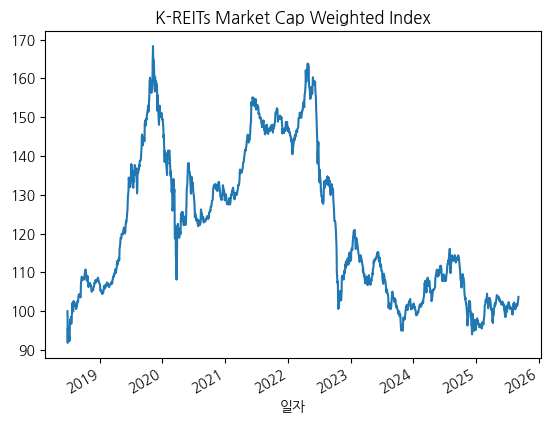

In [ ]:
import pandas as pd

# 1. 데이터 불러오기 (이미 merged 데이터프레임이 있다고 가정: df)
# df의 컬럼이 MultiIndex (리츠명, 데이터종류)라고 가정합니다.
# 만약 MultiIndex가 아니라면 pd.read_csv(..., header=[0, 1]) 등으로 불러오세요.

# 2. 주가(Close)와 시가총액(marcaps) 분리
close_df = merged.xs('Close', level=1, axis=1)   # 주가 데이터
marcap_df = merged.xs('marcaps', level=1, axis=1) # 시가총액 데이터

# 3. 일간 수익률 계산
# 신규 상장일은 전일 데이터가 없어 NaN이 되고, 상장 다음날부터 수익률이 계산됩니다.
returns = close_df.pct_change()

# 4. 가중치 계산 (핵심 로직)
# 오늘의 지수 수익률 = (A종목 수익률 * 어제 A시총비중) + (B종목 수익률 * 어제 B시총비중)...
# 따라서 시가총액 데이터를 하루 뒤로 미룹니다(shift).
prev_marcap = marcap_df.shift(1)

# *중요*: 오늘 수익률이 존재하는(거래된) 종목만 가중치 계산에 포함해야 합니다.
# (갓 상장한 종목은 수익률이 NaN이므로, 분모(총 시총)에서도 제외해야 왜곡이 없습니다)
valid_mask = returns.notna()
effective_weights = prev_marcap * valid_mask

# 가중치 정규화 (합이 1이 되도록 비중 조절)
weights = effective_weights.div(effective_weights.sum(axis=1), axis=0)

# 5. 지수 수익률 산출
# (개별 종목 수익률 x 비중)의 합
index_daily_return = (returns * weights).sum(axis=1)

# 6. 지수화 (기준일 100)
# 초기 NaN(데이터 없는 기간)은 0으로 처리하여 누적곱 계산
reits_index = (1 + index_daily_return.fillna(0)).cumprod() * 100

In [367]:
merged.index[0]

Timestamp('2018-06-27 00:00:00')

In [393]:
reits_index.iloc[1500:1550]

일자
2024-07-29    114.348376
2024-07-30    115.069009
2024-07-31    115.738999
2024-08-01    116.082017
2024-08-02    114.351524
2024-08-05    109.799413
2024-08-06    112.273455
2024-08-07    113.920093
2024-08-08    111.705250
2024-08-09    112.242357
2024-08-12    113.677549
2024-08-13    113.421234
2024-08-14    114.402453
2024-08-16    113.914078
2024-08-19    113.615435
2024-08-20    113.347586
2024-08-21    113.099078
2024-08-22    112.955207
2024-08-23    113.085084
2024-08-26    113.841173
2024-08-27    113.591152
2024-08-28    113.456229
2024-08-29    113.174340
2024-08-30    114.423800
2024-09-02    113.604092
2024-09-03    113.770344
2024-09-04    113.419541
2024-09-05    112.544793
2024-09-06    113.436080
2024-09-09    113.005999
2024-09-10    113.809002
2024-09-11    113.525113
2024-09-12    113.460844
2024-09-13    113.143193
2024-09-19    114.406809
2024-09-20    114.257917
2024-09-23    113.830131
2024-09-24    113.425927
2024-09-25    112.679291
2024-09-26    112.5819

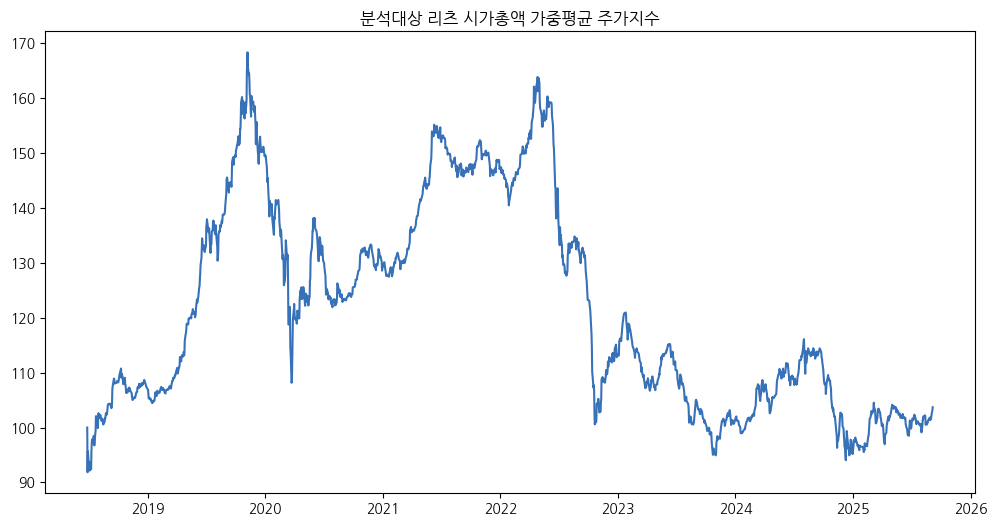

In [370]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(reits_index.index, reits_index, color="#054DA6", alpha=0.8)
plt.title("분석대상 리츠 시가총액 가중평균 주가지수")
plt.show()

In [352]:
import pandas as pd

# 1. 날짜 컬럼을 실제 날짜 형식(datetime)으로 변환하고 인덱스로 설정
merged['일자'] = pd.to_datetime(merged['일자'])
merged = merged.set_index('일자')

# 2. 컬럼 정리 (리츠 이름과 데이터 종류로 멀티 인덱스 생성)
# 현재 컬럼이 ['ESR..', 'ESR..', 'KB..', 'KB..'] 처럼 이름이 중복되어 있을 겁니다.
# 이를 (리츠명, 'Close'), (리츠명, 'Marcap') 형태로 정리합니다.

# 리츠 이름 추출 (중복 제거하지 않고 순서대로)
reit_names = merged.columns[::2] # 0, 2, 4... 번째 컬럼이 리츠 이름이라고 가정 (혹은 현재 컬럼명 활용)

# 새로운 컬럼 리스트 생성
new_columns = []
current_reit = ""

# *주의*: 데이터 로드 방식에 따라 컬럼명이 다를 수 있어, 
# 홀수번째 컬럼=주가, 짝수번째 컬럼=시총으로 강제 지정하는 방식이 가장 확실합니다.
for i in range(len(merged.columns) // 2):
    reit_name = merged.columns[2*i] # 짝수 인덱스(0, 2, 4...)에서 이름 가져오기
    # 만약 컬럼명이 'ESR켄달스퀘어리츠.1' 처럼 되어 있다면 '.1' 제거
    reit_name = reit_name.split('.')[0] 
    
    new_columns.append((reit_name, 'Close'))   # 주가
    new_columns.append((reit_name, 'marcaps')) # 시총

merged.columns = pd.MultiIndex.from_tuples(new_columns)

print("데이터 정리 완료!")
print(merged.head()) # 날짜가 굵은 글씨(인덱스)로 바뀌었는지 확인

AttributeError: 'tuple' object has no attribute 'split'